# MSIN0167: Data Visualisation Group Coursework Part A

#### Group Members:
 * Dilani Antonvijayakumar - 21033288
 * Pei-Yun Tsai - 24173400
 * Disha Kalra - 24221928
 * Candice Yang 24218777


#### Link to our webpage: https://divorces-in-europe---msin0167-team-k.glitch.me/

In [197]:
# To display full output in Notebook, instead of only the last result
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Table of Contents
### 1. [Data Wrangling](#data-wrangling)
  * [Initial analysis of the data](#inital-analysis-of-the-data)
  * [Cleaning the data](#cleaning-the-dataset)
  * [Merging other datasets](#merging-other-data)
### 2. [Exploring the Data](#data-exploring)
  * [Exploratory Data Visualisation](#exploratory-data-visualisations)
  * [Creating new variables](#creating-new-variables)
  * [Correlation Matrix](#correlation-matrix)
### 3. [Presenting the Data](#data-presenting)
  * [Selection of static charts](#selection-of-static-charts)
  * [Selection of dynamic charts](#selection-of-dynamic-charts)
  * [Plotly Interactive Maps](#plotly-interactive-maps)
### 4. [Presenting the Data](#presenting-the-data)
### 5. [Datawrapper Charts](#datawrapper)
### 6. [Conclusion](#conclusion)

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

## **1. Data Wrangling <a class="anchor" id="data-wrangling"></a>**

Our final dataset is a compilation of datasets sourced from:
* UNdata Explorer: http://data.un.org/Explorer.aspx?d=POP&f=tableCode%3a16
   * Divorces by urban/rural residence
   * Marriages by urban/rural residence
   * Per capita GDP at current prices - US dollars
* World Bank data:
   * Population https://data.worldbank.org/indicator/SP.POP.TOTL
   * Urbanisation Rate https://data.worldbank.org/indicator/SP.URB.TOTL.IN.ZS

We extracted data for only the European countries from the datasets listed above. These were compiled together to produce our final dataset, where the following section of this notebook details the cleaning and merging process. 

In [274]:
df = pd.read_csv("Europe Divorce Rates.csv")
pd.options.display.max_columns = None

## 1.1 Initial analysis of the data <a class="anchor" id="inital-analysis-of-the-data"></a>

#### **Developing an overall insight of the data**

In [10]:
df.head()
df.describe()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4441 entries, 0 to 4440
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Country or Area  4441 non-null   object 
 1   Year             4441 non-null   object 
 2   Area             4396 non-null   object 
 3   Record Type      4396 non-null   object 
 4   Reliability      4396 non-null   object 
 5   Source Year      4396 non-null   float64
 6   Value            4396 non-null   float64
 7   Value Footnotes  1349 non-null   object 
dtypes: float64(2), object(6)
memory usage: 277.7+ KB


#### **Checking how many unique countries we have**

In [12]:
unique_countries = df['Country or Area'].unique().tolist()
print(unique_countries)
df.tail()

['Albania', 'Andorra', 'Armenia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Monaco', 'Montenegro', 'Netherlands (Kingdom of the)', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Republic of Moldova', 'Romania', 'Russian Federation', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Türkiye', 'Ukraine', 'United Kingdom of Great Britain and Northern Ireland', 'footnoteSeqID', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44']


,Country or Area,Year,Area,Record Type,Reliability,Source Year,Value,Value Footnotes
4436,40,The Government of Ukraine has informed the Uni...,NaN,NaN,NaN,NaN,NaN,NaN
4437,41,Data are given according to the state of civil...,NaN,NaN,NaN,NaN,NaN,NaN
4438,42,Data tabulated by date of occurrence for Engla...,NaN,NaN,NaN,NaN,NaN,NaN
4439,43,Excluding Channel Islands (Guernsey and Jersey...,NaN,NaN,NaN,NaN,NaN,NaN
4440,44,Data refer to England and Wales only.,NaN,NaN,NaN,NaN,NaN,NaN


## 1.2 Cleaning the dataset <a class="anchor" id="cleaning-the-dataset"></a>

#### **We found that the end of the dataset had non-country rows and we had to remove these**

In [276]:
# Step 1: Filter out rows where 'Country' is numeric or 'footnoteSeqID'
df = df[~df['Country or Area'].str.match(r'^\d+$|footnoteSeqID')]
# Step 2: Get unique country names
unique_countries = [x for x in df['Country or Area'].unique() if not str(x).isdigit()]
# Print the unique country names
print(unique_countries)
df.tail()

['Albania', 'Andorra', 'Armenia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Monaco', 'Montenegro', 'Netherlands (Kingdom of the)', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Republic of Moldova', 'Romania', 'Russian Federation', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Türkiye', 'Ukraine', 'United Kingdom of Great Britain and Northern Ireland']


,Country or Area,Year,Area,Record Type,Reliability,Source Year,Value,Value Footnotes
4391,United Kingdom of Great Britain and Northern I...,1952,Total,Data tabulated by year of occurrence,"Final figure, complete",1988.0,36134.0,"42,43"
4392,United Kingdom of Great Britain and Northern I...,1951,Total,Data tabulated by year of occurrence,"Final figure, complete",1988.0,30366.0,"42,43"
4393,United Kingdom of Great Britain and Northern I...,1950,Total,Data tabulated by year of occurrence,"Final figure, complete",1988.0,32671.0,"42,43"
4394,United Kingdom of Great Britain and Northern I...,1949,Total,Data tabulated by year of occurrence,"Final figure, complete",1988.0,36823.0,"42,43"
4395,United Kingdom of Great Britain and Northern I...,1948,Total,Data tabulated by year of occurrence,"Final figure, complete",1988.0,44919.0,"42,43"


#### **Once we obtained only rows with countries, we can recheck the names and count of the countries in the dataset**

In [241]:
unique_countries = df['Country or Area'].unique().tolist()

# Count the number of unique country names
unique_count = df['Country or Area'].nunique()

# Print the results
print("List of unique countries:", unique_countries)
print("Count of unique countries:", unique_count)

List of unique countries: ['Albania', 'Andorra', 'Armenia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Monaco', 'Montenegro', 'Netherlands (Kingdom of the)', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Republic of Moldova', 'Romania', 'Russian Federation', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Türkiye', 'Ukraine', 'United Kingdom of Great Britain and Northern Ireland']
Count of unique countries: 48


#### **Removing unwanted columns**

In [278]:
# Remove the value footnotes and sourced year columns 
df.drop(columns=['Record Type', 'Reliability', 'Source Year', 'Value Footnotes'], inplace=True)
df.head()

,Country or Area,Year,Area,Value
0,Albania,2021,Total,3113.0
1,Albania,2020,Total,4267.0
2,Albania,2019,Total,5860.0
3,Albania,2018,Total,4846.0
4,Albania,2017,Total,4508.0


#### **Converting the country names to be standard**

In [280]:
# Change country names to get a suitable format
#import country_converter as coco
cc = coco.CountryConverter()
df['Country or Area'] = cc.convert(names = df['Country or Area'], to = 'name_short') 
unique_countries = df['Country or Area'].unique().tolist()
print("List of unique countries:", unique_countries)
df.tail()

List of unique countries: ['Albania', 'Andorra', 'Armenia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Monaco', 'Montenegro', 'Netherlands', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Moldova', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Türkiye', 'Ukraine', 'United Kingdom']


,Country or Area,Year,Area,Value
4391,United Kingdom,1952,Total,36134.0
4392,United Kingdom,1951,Total,30366.0
4393,United Kingdom,1950,Total,32671.0
4394,United Kingdom,1949,Total,36823.0
4395,United Kingdom,1948,Total,44919.0


#### **Changing the columns name of Country or Area to Country and changing the Year column to integer**

In [284]:
df.rename(columns={'Country or Area': 'Country'}, inplace=True)
df.rename(columns={'Value': 'Divorces'}, inplace=True)
df['Year'] = df['Year'].astype(int)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4396 entries, 0 to 4395
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Country   4396 non-null   object 
 1   Year      4396 non-null   int32  
 2   Area      4396 non-null   object 
 3   Divorces  4396 non-null   float64
dtypes: float64(1), int32(1), object(2)
memory usage: 154.5+ KB


#### **Checking for duplicate data**

In [286]:
print(df.duplicated().sum()) 

0


#### **Checking for Missing Values**
* Our data has values across multiple years so we want to check whether countries have missing data for specific years. The plot below shows a useful representation of this. 

<Figure size 1200x800 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Missing Countries for Each Year')

Text(0.5, 58.7222222222222, 'Country')

Text(120.72222222222221, 0.5, 'Year')

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5, 31.5, 32.5,
        33.5, 34.5, 35.5, 36.5, 37.5, 38.5, 39.5, 40.5, 41.5, 42.5, 43.5,
        44.5, 45.5, 46.5, 47.5]),
 [Text(0.5, 0, 'Albania'),
  Text(1.5, 0, 'Andorra'),
  Text(2.5, 0, 'Armenia'),
  Text(3.5, 0, 'Austria'),
  Text(4.5, 0, 'Azerbaijan'),
  Text(5.5, 0, 'Belarus'),
  Text(6.5, 0, 'Belgium'),
  Text(7.5, 0, 'Bosnia and Herzegovina'),
  Text(8.5, 0, 'Bulgaria'),
  Text(9.5, 0, 'Croatia'),
  Text(10.5, 0, 'Cyprus'),
  Text(11.5, 0, 'Czechia'),
  Text(12.5, 0, 'Denmark'),
  Text(13.5, 0, 'Estonia'),
  Text(14.5, 0, 'Finland'),
  Text(15.5, 0, 'France'),
  Text(16.5, 0, 'Georgia'),
  Text(17.5, 0, 'Germany'),
  Text(18.5, 0, 'Greece'),
  Text(19.5, 0, 'Hungary'),
  Text(20.5, 0, 'Iceland'),
  Text(21.5, 0, 'Ireland'),
  Text(22.5, 0, 'Italy'),
  Text(23.5, 0, 'Latvi

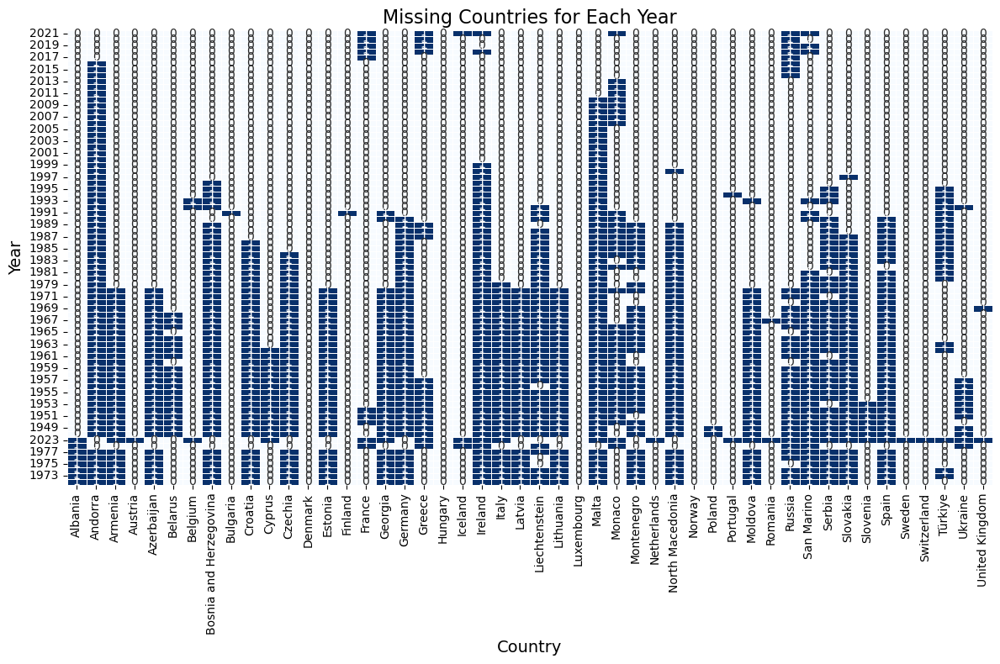

In [288]:
all_countries = df['Country'].unique()

# Create an empty DataFrame with years as rows and countries as columns
missing_df = pd.DataFrame(index=df['Year'].unique(), columns=all_countries)

# Fill the DataFrame with 'X' to indicate missing data
for year in df['Year'].unique():
    countries_in_year = df[df['Year'] == year]['Country'].unique()
    missing_countries = set(all_countries) - set(countries_in_year)
    
    # Mark missing countries with 'X' for each year
    missing_df.loc[year, list(missing_countries)] = 'X'

# Fill any NaN values with an empty string (i.e., countries that have data for the year)
missing_df = missing_df.fillna('')

# Visualize the missing data using a heatmap
plt.figure(figsize=(12, 8))  # Set the figure size
sns.heatmap(missing_df == 'X', annot=True, cmap='Blues', cbar=False, linewidths=0.5)

# Customize the plot
plt.title('Missing Countries for Each Year', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Year', fontsize=14)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping

# Show the plot
plt.show()

##### **We noticed that some countries have a lot of data missing so we decided to remove them from the dataset to make our data more concise**
- After looking into historical information, we realised that some counties have particular reasons for their lack of divorce data. For example, in Malta divorce was only legalised in 2011 so the data is very limited for this country. 

In [290]:
countries_to_remove = ["Andorra", "Malta", "Monaco", "Russia","Montenegro","San Marino"]
# Filtering out rows where the Country column matches any country in the list
df = df[~df["Country"].isin(countries_to_remove)]


* Checking what the missing data looks like after removing selected countries

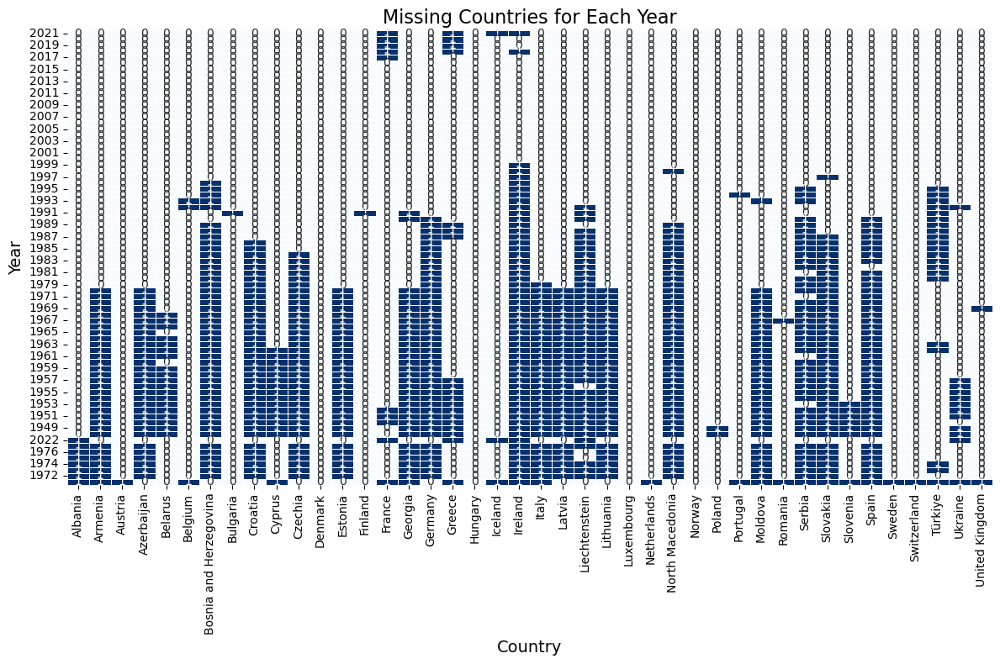

In [105]:
all_countries = df['Country'].unique()

# Create an empty DataFrame with years as rows and countries as columns
missing_df = pd.DataFrame(index=df['Year'].unique(), columns=all_countries)

# Fill the DataFrame with 'X' to indicate missing data
for year in df['Year'].unique():
    countries_in_year = df[df['Year'] == year]['Country'].unique()
    missing_countries = set(all_countries) - set(countries_in_year)
    
    # Mark missing countries with 'X' for each year
    missing_df.loc[year, list(missing_countries)] = 'X'

# Fill any NaN values with an empty string (i.e., countries that have data for the year)
missing_df = missing_df.fillna('')

# Visualize the missing data using a heatmap
plt.figure(figsize=(12, 8))  # Set the figure size
sns.heatmap(missing_df == 'X', annot=True, cmap='Blues', cbar=False, linewidths=0.5)

# Customize the plot
plt.title('Missing Countries for Each Year', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Year', fontsize=14)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping

# Show the plot
plt.show()

Now we have a better selection of countries and can pick visualisations apt to the data we have available

In [292]:
df.head()

,Country,Year,Area,Divorces
0,Albania,2021,Total,3113.0
1,Albania,2020,Total,4267.0
2,Albania,2019,Total,5860.0
3,Albania,2018,Total,4846.0
4,Albania,2017,Total,4508.0


## 1.3 Merging other datasets <a class="anchor" id="merging-other-data"></a>

#### **Merging Population data**

* We need to find data on the population of each country and calculate the divorces per 1000 people

In [296]:
pop = pd.read_csv("Europe Population.csv")
pd.options.display.max_columns = None

In [298]:
pop.head()
pop.info()
pop['Time'].isna()
pop.tail()
pop = pop.dropna(subset=['Time'])
pop.tail()

,Country Name,Country Code,Time,Time Code,"Population, total [SP.POP.TOTL]"
0,Albania,ALB,1960.0,YR1960,1608800.0
1,Albania,ALB,1961.0,YR1961,1659800.0
2,Albania,ALB,1962.0,YR1962,1711319.0
3,Albania,ALB,1963.0,YR1963,1762621.0
4,Albania,ALB,1964.0,YR1964,1814135.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2693 entries, 0 to 2692
Data columns (total 5 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country Name                     2690 non-null   object 
 1   Country Code                     2688 non-null   object 
 2   Time                             2688 non-null   float64
 3   Time Code                        2688 non-null   object 
 4   Population, total [SP.POP.TOTL]  2688 non-null   float64
dtypes: float64(2), object(3)
memory usage: 105.3+ KB


0       False
1       False
2       False
3       False
4       False
        ...  
2688     True
2689     True
2690     True
2691     True
2692     True
Name: Time, Length: 2693, dtype: bool

,Country Name,Country Code,Time,Time Code,"Population, total [SP.POP.TOTL]"
2688,NaN,NaN,NaN,NaN,NaN
2689,NaN,NaN,NaN,NaN,NaN
2690,NaN,NaN,NaN,NaN,NaN
2691,Data from database: World Development Indicators,NaN,NaN,NaN,NaN
2692,Last Updated: 01/28/2025,NaN,NaN,NaN,NaN


,Country Name,Country Code,Time,Time Code,"Population, total [SP.POP.TOTL]"
2683,United Kingdom,GBR,2019.0,YR2019,66836327.0
2684,United Kingdom,GBR,2020.0,YR2020,67081234.0
2685,United Kingdom,GBR,2021.0,YR2021,67026292.0
2686,United Kingdom,GBR,2022.0,YR2022,67791000.0
2687,United Kingdom,GBR,2023.0,YR2023,68350000.0


In [300]:
# Remove specific columns
columns_to_remove = ["Time Code", "Country Code"]  # List of columns to remove
pop = pop.drop(columns=columns_to_remove)

# Rename 'Value' column to 'Population'
pop = pop.rename(columns={"Population, total [SP.POP.TOTL]": "Population","Country Name":"Country","Time":"Year"})

# Change Year to integer
pop['Year'] = pop['Year'].astype(int)
pop['Country'] = cc.convert(names = pop['Country'], to = 'name_short') 
# Display the resulting DataFrame
pop.tail()

,Country,Year,Population
2683,United Kingdom,2019,66836327.0
2684,United Kingdom,2020,67081234.0
2685,United Kingdom,2021,67026292.0
2686,United Kingdom,2022,67791000.0
2687,United Kingdom,2023,68350000.0


In [302]:
df_original = pd.DataFrame(df)
df_population = pd.DataFrame(pop)

# Merge the two datasets on 'Country' and 'Year'
df_merged = pd.merge(df_original, df_population, on=['Country', 'Year'], how='left')

# Display the merged DataFrame
df_merged.head()
df_merged.info()

,Country,Year,Area,Divorces,Population
0,Albania,2021,Total,3113.0,2811666.0
1,Albania,2020,Total,4267.0,2837849.0
2,Albania,2019,Total,5860.0,2854191.0
3,Albania,2018,Total,4846.0,2866376.0
4,Albania,2017,Total,4508.0,2873457.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4195 entries, 0 to 4194
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Country     4195 non-null   object 
 1   Year        4195 non-null   int32  
 2   Area        4195 non-null   object 
 3   Divorces    4195 non-null   float64
 4   Population  3959 non-null   float64
dtypes: float64(2), int32(1), object(2)
memory usage: 147.6+ KB


#### **Merging GDP data**

In [308]:
gdp = pd.read_excel('Europe GDP per capita.xlsx') 
gdp.head()
gdp['Country'] = gdp['Country'].replace("TÃ¼rkiye", "Turkey")
gdp['Country'] = cc.convert(names = gdp['Country'], to = 'name_short') 

,Country,Year,GDP
0,Albania,2022,6655.26
1,Albania,2021,6281.05
2,Albania,2020,5288.99
3,Albania,2019,5359.24
4,Albania,2018,5268.12


In [314]:
# Merge the two datasets on 'Country' and 'Year'
merged = pd.merge(df_merged, gdp, on=['Country', 'Year'], how='left')

# Display the merged DataFrame
merged.head()
merged.info()

,Country,Year,Area,Divorces,Population,GDP
0,Albania,2021,Total,3113.0,2811666.0,6281.05
1,Albania,2020,Total,4267.0,2837849.0,5288.99
2,Albania,2019,Total,5860.0,2854191.0,5359.24
3,Albania,2018,Total,4846.0,2866376.0,5268.12
4,Albania,2017,Total,4508.0,2873457.0,4521.75


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4195 entries, 0 to 4194
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Country     4195 non-null   object 
 1   Year        4195 non-null   int32  
 2   Area        4195 non-null   object 
 3   Divorces    4195 non-null   float64
 4   Population  3959 non-null   float64
 5   GDP         3264 non-null   float64
dtypes: float64(3), int32(1), object(2)
memory usage: 180.4+ KB


#### **Merging Longitute and Latitude Values for each country**

In [316]:
country_coords = pd.read_csv("Country Coords.csv") 
country_coords.rename(columns={"country": "Country"}, inplace=True)
country_coords['Country'] = cc.convert(names = country_coords['Country'], to = 'name_short') 
country_coords.head()
merged = merged.merge(country_coords, on="Country", how="left")
merged.head()
merged.info()

Netherlands Antilles not found in regex
Congo [Republic] not found in regex


,latitude,longitude,Country
0,42.546245,1.601554,Andorra
1,23.424076,53.847818,United Arab Emirates
2,33.939110,67.709953,Afghanistan
3,17.060816,-61.796428,Antigua and Barbuda
4,18.220554,-63.068615,Anguilla


,Country,Year,Area,Divorces,Population,GDP,latitude,longitude
0,Albania,2021,Total,3113.0,2811666.0,6281.05,41.153332,20.168331
1,Albania,2020,Total,4267.0,2837849.0,5288.99,41.153332,20.168331
2,Albania,2019,Total,5860.0,2854191.0,5359.24,41.153332,20.168331
3,Albania,2018,Total,4846.0,2866376.0,5268.12,41.153332,20.168331
4,Albania,2017,Total,4508.0,2873457.0,4521.75,41.153332,20.168331


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4195 entries, 0 to 4194
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Country     4195 non-null   object 
 1   Year        4195 non-null   int32  
 2   Area        4195 non-null   object 
 3   Divorces    4195 non-null   float64
 4   Population  3959 non-null   float64
 5   GDP         3264 non-null   float64
 6   latitude    4195 non-null   float64
 7   longitude   4195 non-null   float64
dtypes: float64(5), int32(1), object(2)
memory usage: 245.9+ KB


In [318]:
merged.rename(columns={'latitude': 'Latitude', 'longitude': 'Longitude','GDP':'GDP Per Capita'}, inplace=True)
merged.head()

,Country,Year,Area,Divorces,Population,GDP Per Capita,Latitude,Longitude
0,Albania,2021,Total,3113.0,2811666.0,6281.05,41.153332,20.168331
1,Albania,2020,Total,4267.0,2837849.0,5288.99,41.153332,20.168331
2,Albania,2019,Total,5860.0,2854191.0,5359.24,41.153332,20.168331
3,Albania,2018,Total,4846.0,2866376.0,5268.12,41.153332,20.168331
4,Albania,2017,Total,4508.0,2873457.0,4521.75,41.153332,20.168331


#### **Merging Urbanisation Rate**

In [320]:
# Load urbanisation rate dataset
urban_df = pd.read_csv('Europe Urbanisation Rate.csv') 
urban_df = urban_df.drop_duplicates(subset=['Country', 'Year'])
urban_df['Country'] = cc.convert(names = urban_df['Country'], to = 'name_short') 
# Merge the datasets on country and year
merged_df = pd.merge(merged, urban_df, on=['Country', 'Year'], how='left')
merged_df.head()
merged_df.info()

,Country,Year,Area,Divorces,Population,GDP Per Capita,Latitude,Longitude,Urbanization Rate
0,Albania,2021,Total,3113.0,2811666.0,6281.05,41.153332,20.168331,0.6297
1,Albania,2020,Total,4267.0,2837849.0,5288.99,41.153332,20.168331,0.6211
2,Albania,2019,Total,5860.0,2854191.0,5359.24,41.153332,20.168331,0.6123
3,Albania,2018,Total,4846.0,2866376.0,5268.12,41.153332,20.168331,0.6032
4,Albania,2017,Total,4508.0,2873457.0,4521.75,41.153332,20.168331,0.5938


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4195 entries, 0 to 4194
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Country            4195 non-null   object 
 1   Year               4195 non-null   int32  
 2   Area               4195 non-null   object 
 3   Divorces           4195 non-null   float64
 4   Population         3959 non-null   float64
 5   GDP Per Capita     3264 non-null   float64
 6   Latitude           4195 non-null   float64
 7   Longitude          4195 non-null   float64
 8   Urbanization Rate  3806 non-null   float64
dtypes: float64(6), int32(1), object(2)
memory usage: 278.7+ KB


In [322]:
merged_df.rename(columns={'Urbanization Rate': 'Urbanisation Rate'}, inplace=True)
merged_df.head()

,Country,Year,Area,Divorces,Population,GDP Per Capita,Latitude,Longitude,Urbanisation Rate
0,Albania,2021,Total,3113.0,2811666.0,6281.05,41.153332,20.168331,0.6297
1,Albania,2020,Total,4267.0,2837849.0,5288.99,41.153332,20.168331,0.6211
2,Albania,2019,Total,5860.0,2854191.0,5359.24,41.153332,20.168331,0.6123
3,Albania,2018,Total,4846.0,2866376.0,5268.12,41.153332,20.168331,0.6032
4,Albania,2017,Total,4508.0,2873457.0,4521.75,41.153332,20.168331,0.5938


#### **Merging Number of Marriages**

* Having plotted the divorces and noticing a downward trend we wondered whether this was an accruate representation of marriage success. We realized that beyond absolute divorce counts, it's crucial to understand the proportion of divorces relative to marriages

In [332]:
marriage_df = pd.read_csv('Europe Marriages.csv') 
# Dropping unnecessary columns
marriage_df = marriage_df.drop(columns=["Record Type", "Source Year", "Reliability", "Value Footnotes"])
nan_count = marriage_df['Country or Area'].isna().sum()
marriage_df = marriage_df.dropna(subset=['Country or Area'])
# Display the result
print(f"Number of NaN values in 'Country' column: {nan_count}")
# Renaming columns and changing country names 
marriage_df = marriage_df.rename(columns={"Value": "Marriages", "Country or Area": "Country"})
marriage_df['Country'] = cc.convert(names = marriage_df['Country'], to = 'name_short') 
# Merging the dataframes on Country, Year, and Area
merged_data = merged_df.merge(marriage_df, on=["Country", "Year", "Area"], how="left")

# # Display info to verify merge
print(merged_data.info())
print(merged_data.head())


Number of NaN values in 'Country' column: 37
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4195 entries, 0 to 4194
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Country            4195 non-null   object 
 1   Year               4195 non-null   int32  
 2   Area               4195 non-null   object 
 3   Divorces           4195 non-null   float64
 4   Population         3959 non-null   float64
 5   GDP Per Capita     3264 non-null   float64
 6   Latitude           4195 non-null   float64
 7   Longitude          4195 non-null   float64
 8   Urbanisation Rate  3806 non-null   float64
 9   Marriages          4004 non-null   float64
dtypes: float64(7), int32(1), object(2)
memory usage: 311.5+ KB
None
   Country  Year   Area  Divorces  Population  GDP Per Capita   Latitude  \
0  Albania  2021  Total    3113.0   2811666.0         6281.05  41.153332   
1  Albania  2020  Total    4267.0   2837849.0      

In [338]:
merged_data.head()
merged_data.info()

,Country,Year,Area,Divorces,Population,GDP Per Capita,Latitude,Longitude,Urbanisation Rate,Marriages
0,Albania,2021,Total,3113.0,2811666.0,6281.05,41.153332,20.168331,0.6297,19709.0
1,Albania,2020,Total,4267.0,2837849.0,5288.99,41.153332,20.168331,0.6211,17473.0
2,Albania,2019,Total,5860.0,2854191.0,5359.24,41.153332,20.168331,0.6123,22415.0
3,Albania,2018,Total,4846.0,2866376.0,5268.12,41.153332,20.168331,0.6032,23104.0
4,Albania,2017,Total,4508.0,2873457.0,4521.75,41.153332,20.168331,0.5938,22641.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4195 entries, 0 to 4194
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Country            4195 non-null   object 
 1   Year               4195 non-null   int32  
 2   Area               4195 non-null   object 
 3   Divorces           4195 non-null   float64
 4   Population         3959 non-null   float64
 5   GDP Per Capita     3264 non-null   float64
 6   Latitude           4195 non-null   float64
 7   Longitude          4195 non-null   float64
 8   Urbanisation Rate  3806 non-null   float64
 9   Marriages          4004 non-null   float64
dtypes: float64(7), int32(1), object(2)
memory usage: 311.5+ KB


#### **Saving final dataset**

In [340]:
merged_data.to_csv('Europe Final Data.csv', index=False)

## **Reading the Cleaned Dataset** - Run Code from here to work with the Cleaned Data

In [342]:
# To display full output in Notebook, instead of only the last result
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr"

In [5]:
df = pd.read_csv("Europe Final Data.csv")
df.head()

,Country,Year,Area,Divorces,Population,GDP Per Capita,Latitude,Longitude,Urbanisation Rate,Marriages
0,Albania,2021,Total,3113.0,2811666.0,6281.05,41.153332,20.168331,0.6297,19709.0
1,Albania,2020,Total,4267.0,2837849.0,5288.99,41.153332,20.168331,0.6211,17473.0
2,Albania,2019,Total,5860.0,2854191.0,5359.24,41.153332,20.168331,0.6123,22415.0
3,Albania,2018,Total,4846.0,2866376.0,5268.12,41.153332,20.168331,0.6032,23104.0
4,Albania,2017,Total,4508.0,2873457.0,4521.75,41.153332,20.168331,0.5938,22641.0


In [346]:
df.info()
print(df["Country"].unique())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4195 entries, 0 to 4194
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Country            4195 non-null   object 
 1   Year               4195 non-null   int64  
 2   Area               4195 non-null   object 
 3   Divorces           4195 non-null   float64
 4   Population         3959 non-null   float64
 5   GDP Per Capita     3264 non-null   float64
 6   Latitude           4195 non-null   float64
 7   Longitude          4195 non-null   float64
 8   Urbanisation Rate  3806 non-null   float64
 9   Marriages          4004 non-null   float64
dtypes: float64(7), int64(1), object(2)
memory usage: 327.9+ KB
['Albania' 'Armenia' 'Austria' 'Azerbaijan' 'Belarus' 'Belgium'
 'Bosnia and Herzegovina' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia'
 'Denmark' 'Estonia' 'Finland' 'France' 'Georgia' 'Germany' 'Greece'
 'Hungary' 'Iceland' 'Ireland' 'Italy' 'Latvia' 'Liech

## **2. Exploring the dataset** <a class="anchor" id="data-exploring"></a>

### 2.1 Exploratory Data Visualisations <a class="anchor" id="exploratory-data-visualisations"></a>

#### **Plotting basic line chart for divorce numbers for a single country (Switzerland)**

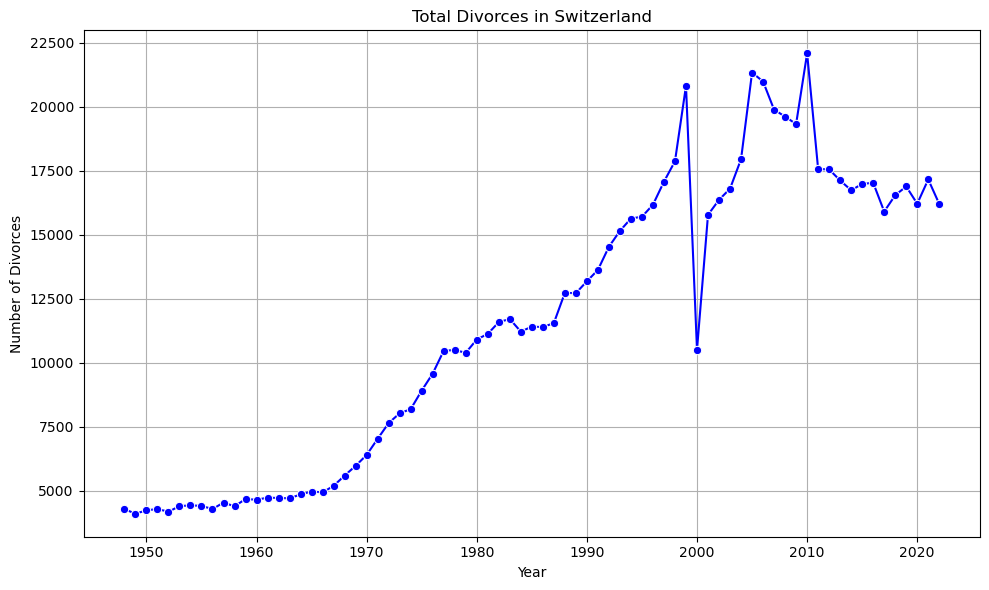

In [348]:
country_name = 'Switzerland'
filtered_country = df[(df['Country'] == country_name) & (df['Area'] == 'Total')]

# Plotting for one country
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_country, x='Year', y='Divorces', marker='o', color='blue')

# Customize the plot
plt.title(f'Total Divorces in {country_name}')
plt.xlabel('Year')
plt.ylabel('Number of Divorces')
plt.grid(True)
plt.tight_layout()
plt.savefig("Switzerland Divorces.png")
# Show the plot
plt.show()

#### **Plotting basic line chart for multiple countries**

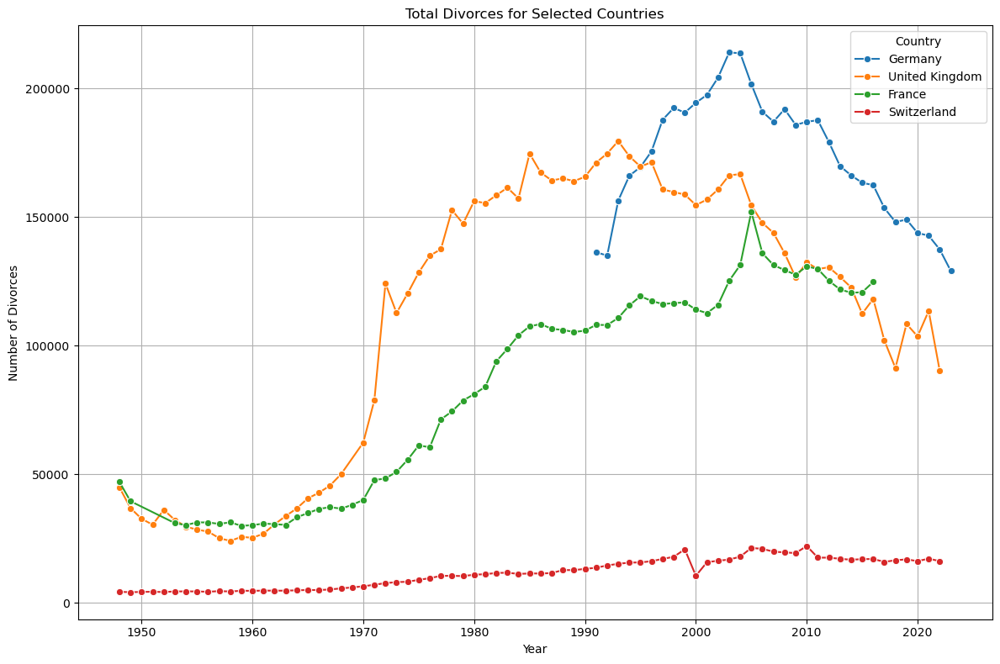

In [350]:
countries=['Germany', 'United Kingdom', 'France','Switzerland']
plt.figure(figsize=(12, 8))

for country_name in countries:
    filtered_country = df[(df['Country'] == country_name) & (df['Area'] == 'Total')]
    sns.lineplot(data=filtered_country, x='Year', y='Divorces', marker='o', label=country_name)

# Customize the plot
plt.title('Total Divorces for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Number of Divorces')
plt.legend(title='Country')
plt.grid(True)
plt.tight_layout()

# Show the combined plot
plt.show()

### 2.2 Creating New Variables <a class="anchor" id="creating-new-variables"></a>

#### **Creating variable Divorce Rate**

* We noticed that the number of divorces would not be comparable because of the different populations across the countries so we decided to create a new variable called Divorce Rate (calculating the number of divorces per 100,000)

In [7]:
df['Divorce Rate'] = df.apply(lambda row: (row['Divorces'] / row['Population']) * 100000 
                              if row['Area'] == 'Total' else None, axis=1)

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4195 entries, 0 to 4194
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Country            4195 non-null   object 
 1   Year               4195 non-null   int64  
 2   Area               4195 non-null   object 
 3   Divorces           4195 non-null   float64
 4   Population         3959 non-null   float64
 5   GDP Per Capita     3264 non-null   float64
 6   Latitude           4195 non-null   float64
 7   Longitude          4195 non-null   float64
 8   Urbanisation Rate  3806 non-null   float64
 9   Marriages          4004 non-null   float64
 10  Divorce Rate       2133 non-null   float64
dtypes: float64(8), int64(1), object(2)
memory usage: 360.6+ KB


* We noticed that divorce rate only applied to the rows where Area was equal to Total so using urbanisation rate, we calculated values for Divorce Rate for the rows where Area equals Urban or Rural as this would give us deeper insights

In [9]:
def recalculate_divorce_rate(row):
    if row['Area'] == "Total":  # Skip rows where Area is "Total"
        return row['Divorce Rate']

    if row['Area'] == "Urban":
        urban_population = row['Population'] * row['Urbanisation Rate']
        if urban_population > 0:
            return (row['Divorces'] / urban_population) * 100000

    if row['Area'] == "Rural":
        rural_population = row['Population'] * (1 - row['Urbanisation Rate'])
        if rural_population > 0:
            return (row['Divorces'] / rural_population) * 100000

    return row['Divorce Rate']  # Keep existing value if conditions are not met

# Apply function to recalculate divorce rate
df['Divorce Rate'] = df.apply(recalculate_divorce_rate, axis=1)
# Print updated dataset
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4195 entries, 0 to 4194
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Country            4195 non-null   object 
 1   Year               4195 non-null   int64  
 2   Area               4195 non-null   object 
 3   Divorces           4195 non-null   float64
 4   Population         3959 non-null   float64
 5   GDP Per Capita     3264 non-null   float64
 6   Latitude           4195 non-null   float64
 7   Longitude          4195 non-null   float64
 8   Urbanisation Rate  3806 non-null   float64
 9   Marriages          4004 non-null   float64
 10  Divorce Rate       3875 non-null   float64
dtypes: float64(8), int64(1), object(2)
memory usage: 360.6+ KB


In [175]:
df.head(50)

,Country,Year,Area,Divorces,Population,GDP Per Capita,Latitude,Longitude,Urbanisation Rate,Marriages,Divorce Rate
0,Albania,2021,Total,3113.0,2811666.0,6281.05,41.153332,20.168331,0.6297,19709.0,110.717276
1,Albania,2020,Total,4267.0,2837849.0,5288.99,41.153332,20.168331,0.6211,17473.0,150.360361
2,Albania,2019,Total,5860.0,2854191.0,5359.24,41.153332,20.168331,0.6123,22415.0,205.312118
3,Albania,2018,Total,4846.0,2866376.0,5268.12,41.153332,20.168331,0.6032,23104.0,169.063654
4,Albania,2017,Total,4508.0,2873457.0,4521.75,41.153332,20.168331,0.5938,22641.0,156.884199
5,Albania,2016,Total,4345.0,2876101.0,4117.01,41.153332,20.168331,0.5842,22562.0,151.072581
6,Albania,2015,Total,3761.0,2880703.0,3950.39,41.153332,20.168331,0.5743,24997.0,130.558409
7,Albania,2014,Total,4240.0,2889104.0,4586.61,41.153332,20.168331,0.5642,23769.0,146.758303
8,Albania,2013,Total,3747.0,2895092.0,4425.43,41.153332,20.168331,0.5539,23820.0,129.425939
9,Albania,2012,Total,3561.0,2900401.0,4259.67,41.153332,20.168331,0.5433,22891.0,122.776126


#### **Creating Variable Marriage to Divorce Ratio**

In [11]:
df["Divorce_to_Marriage_Ratio"] = df["Divorces"] / df["Marriages"]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4195 entries, 0 to 4194
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Country                    4195 non-null   object 
 1   Year                       4195 non-null   int64  
 2   Area                       4195 non-null   object 
 3   Divorces                   4195 non-null   float64
 4   Population                 3959 non-null   float64
 5   GDP Per Capita             3264 non-null   float64
 6   Latitude                   4195 non-null   float64
 7   Longitude                  4195 non-null   float64
 8   Urbanisation Rate          3806 non-null   float64
 9   Marriages                  4004 non-null   float64
 10  Divorce Rate               3875 non-null   float64
 11  Divorce_to_Marriage_Ratio  4004 non-null   float64
dtypes: float64(9), int64(1), object(2)
memory usage: 393.4+ KB


### 2.3 Plotting a Correlation Matrix <a class="anchor" id="correlation-matrix"></a>

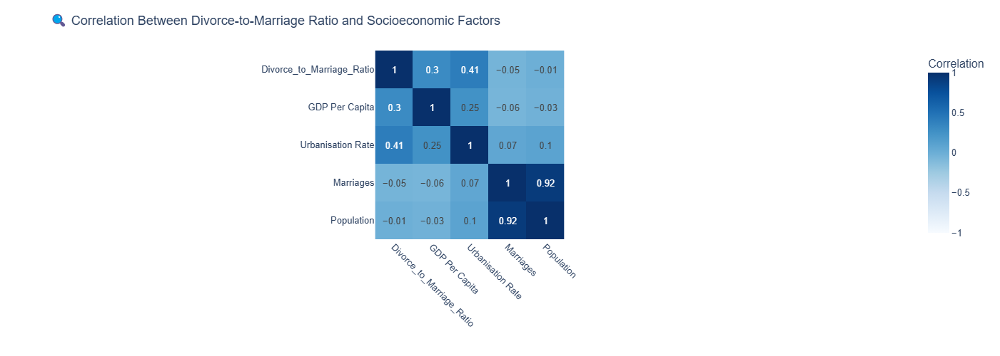

In [567]:
import plotly.express as px

# Subset and clean
features = [
    "Divorce_to_Marriage_Ratio",
    "GDP Per Capita",
    "Urbanisation Rate",
    "Marriages",
    "Population"
]
corr_df = df[features].dropna()
correlation = corr_df.corr().round(2)


# Heatmap with custom color scale where orange is at the higher values
fig = px.imshow(
    correlation,
    text_auto=True,
    color_continuous_scale="blues",  # Custom color scale swapped to orange on top
    zmin=-1, zmax=1,
    labels=dict(color="Correlation"),
    title="🔍 Correlation Between Divorce-to-Marriage Ratio and Socioeconomic Factors"
)

# Style update
fig.update_layout(
    font=dict(family="Arial", size=13),
    title_font=dict(size=18),
    width=700,
    height=500,
    margin=dict(l=50, r=50, t=70, b=50),
    xaxis_title="",
    yaxis_title="",
    xaxis=dict(tickangle=45)
)

# Show the heatmap
fig.show()



## **3. Presenting the Data** <a class="anchor" id="data-presenting"></a>

### 3.1  Selection of Static charts <a class="anchor" id="selection-of-static-charts">

#### **3.1.1  Line Charts of Global Divorce Rate and GDP Per Capita** 

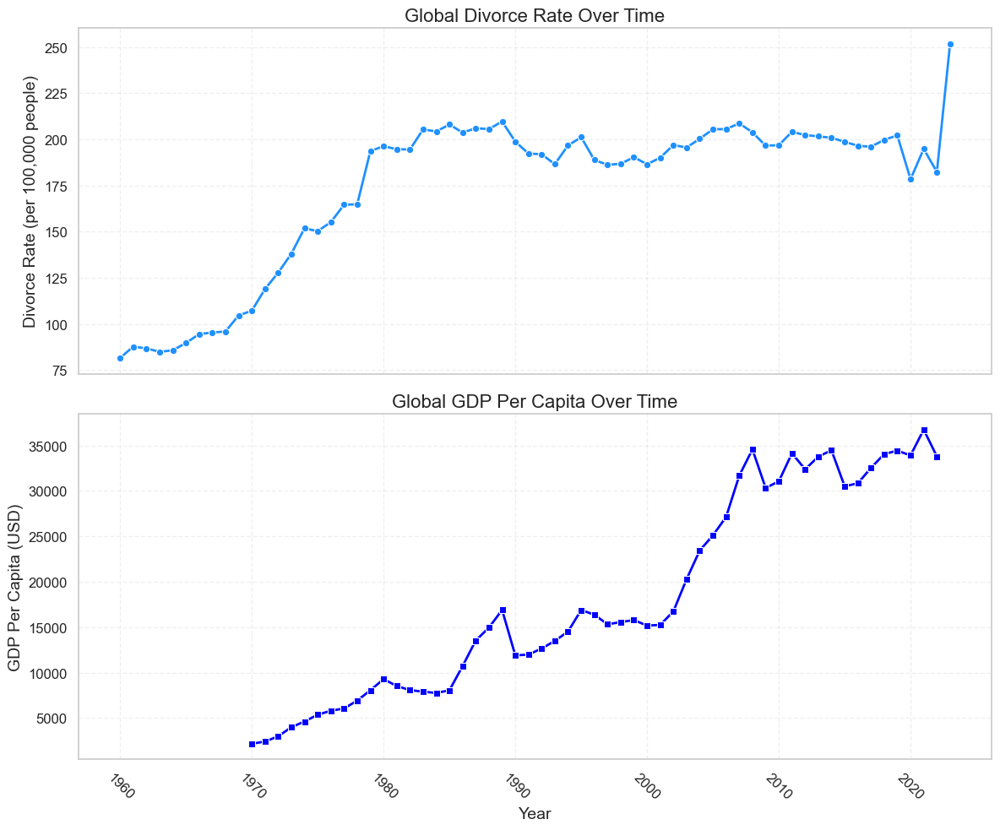

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the DataFrame to keep only rows where Area = "Total"
df_filtered = df[df["Area"] == "Total"]
# Aggregate GDP and Divorce Rate over time
df_total = df_filtered.groupby("Year").agg({"GDP Per Capita": "mean", "Divorce Rate": "mean"}).reset_index()
# Set the aesthetic style of the plots
sns.set(style="whitegrid")
# Create a figure with two subplots
fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
# Divorce Rate over time (top plot)
sns.lineplot(ax=axes[0], x=df_total["Year"], y=df_total["Divorce Rate"], marker="o", color="#1E90FF", linewidth=2)
axes[0].set_ylabel("Divorce Rate (per 100,000 people)", fontsize=14)
axes[0].set_title("Global Divorce Rate Over Time", fontsize=16)
axes[0].grid(True, linestyle="--", alpha=0.3)  # Make gridlines more subtle
axes[0].tick_params(axis="both", labelsize=12)
# GDP over time (bottom plot) r
sns.lineplot(ax=axes[1], x=df_total["Year"], y=df_total["GDP Per Capita"], marker="s", color="blue", linewidth=2)
axes[1].set_ylabel("GDP Per Capita (USD)", fontsize=14)
axes[1].set_title("Global GDP Per Capita Over Time", fontsize=16)
axes[1].grid(True, linestyle="--", alpha=0.3)  # Make gridlines more subtle
axes[1].tick_params(axis="both", labelsize=12)

# Set common x-axis label (non-bold)
plt.xlabel("Year", fontsize=14)
# Rotate x-axis labels for readability
plt.xticks(rotation=-45)
# Adjust the layout for better spacing between subplots
plt.tight_layout()
plt.savefig("gdp.png")
plt.show()



A positive correlation between each country’s GDP per capita and its number of 
divorces has been shown through scatter plotting. The correlation coefficient is 
in the range of 0.5–0.7, indicating a moderate relationship. We might infer that 
economic prosperity has probably increased liberal attitudes toward divorce or 
financial independence, thereby facilitating divorce decisions. However, the 
causality isn’t absolute or clearly definable; other factors, such as cultural and 
legal influences, may also need to be considered.

#### **3.1.2 Average Divorce-to-Marriage Ratio by Region (1960–2023)**

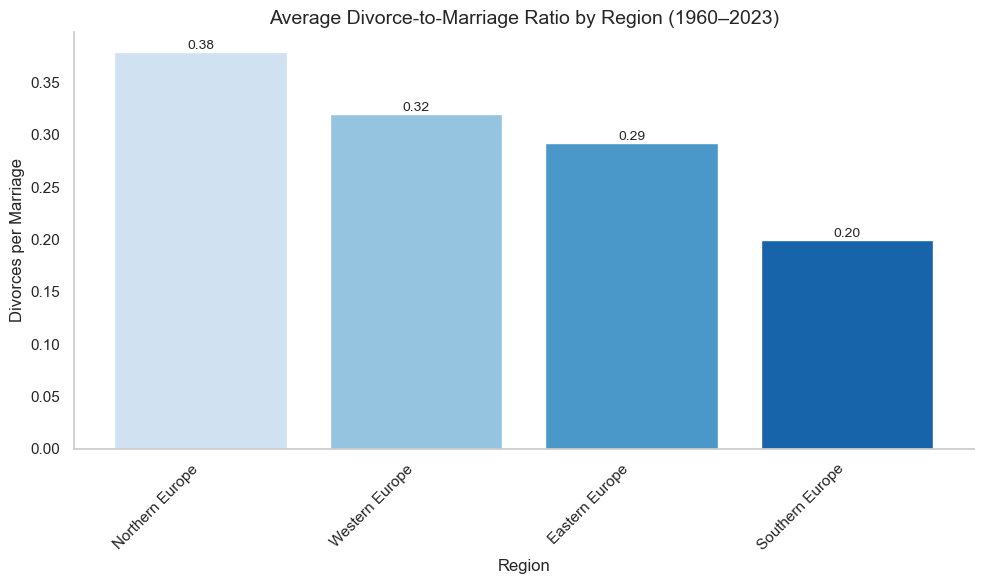

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
# Define a simple regional map for groupings
region_map = {
    "Northern Europe": ["Denmark", "Estonia", "Finland", "Iceland", "Ireland", "Latvia", "Lithuania", "Norway", "Sweden", "United Kingdom"],
    "Southern Europe": ["Albania", "Bosnia and Herzegovina", "Croatia", "Cyprus", "Greece", "Italy", "North Macedonia", "Portugal", "Serbia", "Slovenia", "Spain", "Türkiye"],
    "Western Europe": ["Austria", "Belgium", "France", "Germany", "Liechtenstein", "Luxembourg", "Netherlands", "Switzerland"],
    "Eastern Europe": ["Armenia", "Azerbaijan", "Belarus", "Bulgaria", "Czechia", "Georgia", "Hungary", "Moldova", "Poland", "Romania", "Slovakia", "Ukraine"]
}

# Create a reverse mapping to assign each country a region
country_to_region = {}
for region, countries in region_map.items():
    for country in countries:
        country_to_region[country] = region

# Assign the region to each row in the dataset
df["Region"] = df["Country"].map(country_to_region)


# Filter to Total area only
region_df = df[df["Area"] == "Total"]

# Group and compute average ratio
avg_ratio_by_region = region_df.groupby("Region")["Divorce_to_Marriage_Ratio"].mean().reset_index()

# Sort values
avg_ratio_by_region = avg_ratio_by_region.sort_values("Divorce_to_Marriage_Ratio", ascending=False)

# Define blue color palette
blue_palette = sns.color_palette("Blues", len(avg_ratio_by_region))

# Create figure
fig, ax = plt.subplots(figsize=(10, 6))

# Plot bar chart
bars = ax.bar(
    avg_ratio_by_region["Region"], 
    avg_ratio_by_region["Divorce_to_Marriage_Ratio"], 
    color=blue_palette
)

# Add text labels above bars
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height, f"{height:.2f}", 
            ha='center', va='bottom', fontsize=10)

# Labels and title
ax.set_xlabel("Region", fontsize=12)
ax.set_ylabel("Divorces per Marriage", fontsize=12)
ax.set_title("Average Divorce-to-Marriage Ratio by Region (1960–2023)", fontsize=14, fontweight="normal")  # Unbold title

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha="right")

# Improve aesthetics
sns.despine()
plt.grid(False)  # Removed gridlines

# Show plot
plt.tight_layout()
plt.savefig("barplot1.png")
plt.show()


Northern and Western Europe shoowing higher rates of divorce per marriage - perhaps reflective of the more liberalised lawas and societal notions towards divorce in countries in these areas vs in southern european countries 

#### **3.1.3 Top & Bottom 5 Countries: Average Divorce-to-Marriage Ratio in Europe**

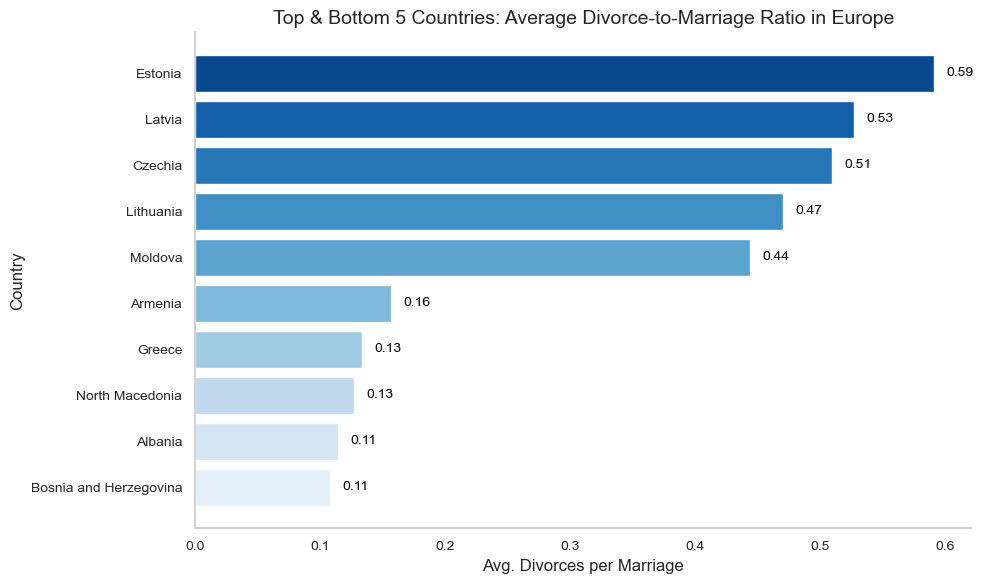

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Average divorce-to-marriage ratio by country
avg_ratio = df.groupby("Country")["Divorce_to_Marriage_Ratio"].mean().sort_values()

# Prepare top & bottom 5
top5 = avg_ratio.tail(5)
bottom5 = avg_ratio.head(5)
highlight_df = pd.concat([bottom5, top5]).reset_index()

# Set blue color palette
blue_palette = sns.color_palette("Blues", len(highlight_df))

# Plot
fig, ax = plt.subplots(figsize=(10, 6))

# Create horizontal bar plot
bars = ax.barh(highlight_df["Country"], highlight_df["Divorce_to_Marriage_Ratio"], color=blue_palette)

# Add labels on the bars
for bar in bars:
    width = bar.get_width()
    ax.text(width + 0.01, bar.get_y() + bar.get_height() / 2, f"{width:.2f}",
            va="center", ha="left", fontsize=10, color="black")

# Title and labels
ax.set_title("Top & Bottom 5 Countries: Average Divorce-to-Marriage Ratio in Europe", fontsize=14, fontweight="normal")
ax.set_xlabel("Avg. Divorces per Marriage", fontsize=12)
ax.set_ylabel("Country", fontsize=12)

# Adjust font and style for readability
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Improve layout and remove gridlines
sns.despine()
ax.grid(False)  # Remove gridlines

plt.tight_layout()
plt.savefig("barplot2.png")
plt.show()



The higher divorce-to-marriage ratio in countries like Estonia, Latvia, Lithuania, Czechia, and Moldova could be attributed to a variety of social, cultural, and economic factors. These nations tend to have more progressive attitudes toward individualism, gender equality, and personal freedom, leading to greater acceptance of divorce as a solution to unhappy marriages. Additionally, economic challenges and changing social norms, especially in post-Soviet countries, may contribute to less stable relationships. In contrast, countries like Armenia, Greece, North Macedonia, Albania, and Bosnia and Herzegovina have more traditional family structures and strong societal expectations around marriage, with higher emphasis on family cohesion and social stigma surrounding divorce. These cultural and religious influences often result in lower divorce rates, as individuals may feel pressure to stay married, despite potential personal dissatisfaction.

### 3.2 Selection of Dynamic Charts <a class="anchor" id="selection-of-dynamic-charts"></a>

#### **3.2.1 Urban vs Rural Divorce Rate in 2005** 

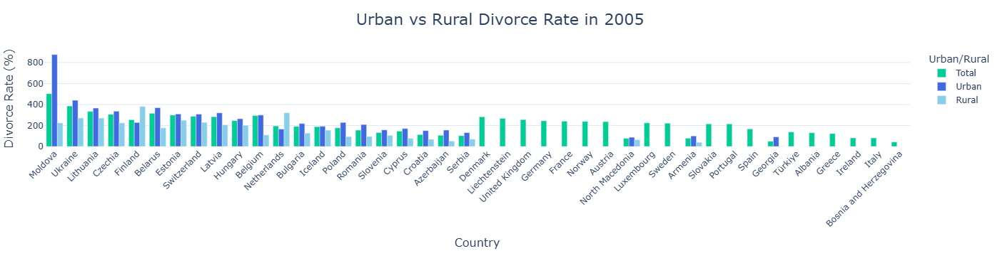

In [573]:
import plotly.express as px

selected_year = 2005
df_year = df[df["Year"] == selected_year]

# Create grouped bar chart
fig = px.bar(df_year, x="Country", y="Divorce Rate", color="Area", 
             barmode="group", title=f"Urban vs Rural Divorce Rate in {selected_year}",
             labels={"Divorce Rate": "Divorce Rate (%)", "Area": "Urban/Rural"},
             height=600,
             color_discrete_map={"Urban": "#4169E1", "Rural": "#87CEEB"})  # Deep & Light Blue shades

# Improve chart aesthetics
fig.update_layout(
    title_font_size=22,
    title_x=0.5,  # Center the title
    xaxis_title_font_size=16,
    yaxis_title_font_size=16,
    legend_title_font_size=14,
    legend_font_size=12,
    margin=dict(l=50, r=50, t=70, b=150),  # Adjust margins for better spacing
    xaxis={'categoryorder': 'total descending'},  # Order by Divorce Rate
    xaxis_tickangle=-45,  # Tilt x-axis labels for better readability
    yaxis=dict(
        showgrid=True, 
        gridwidth=0.6,  # Slightly thicker gridlines
        gridcolor='rgba(70, 130, 180, 0.3)',  # Soft blue-gray gridlines
    ),
    plot_bgcolor='white',  # Set background color to white
    paper_bgcolor='white',  # Set paper background to white
)

# Display the plot
fig.show()


Some countries don't have data for urban and rural and in this case we would have to exclude them from the final graph when presenting. But from the countries that do have this data we see that most of the time the urban rates are much higher than the rural rates

#### **3.2.2 Regression for GDP Capita and Divorce Rate** 

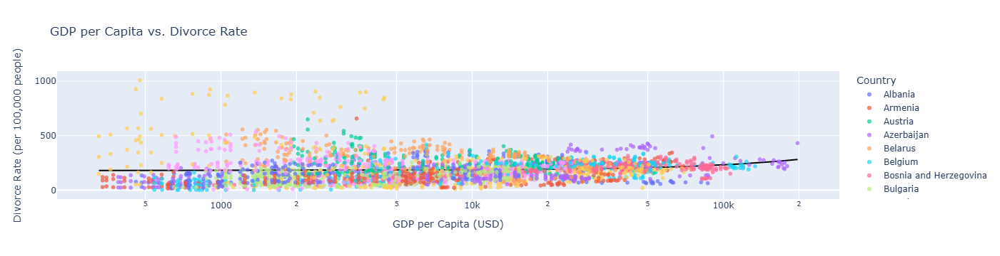

In [430]:
import plotly.express as px
import statsmodels.api as sm
import numpy as np
import pandas as pd

# Drop NaNs and ensure GDP is positive
df1 = df.dropna(subset=["GDP Per Capita", "Divorce Rate"])
df1 = df1[df1["GDP Per Capita"] > 0]  # Fixed to df1

# Perform regression
X = sm.add_constant(df1["GDP Per Capita"])
model = sm.OLS(df1["Divorce Rate"], X).fit()

# Generate regression line
gdp_range = np.linspace(df1["GDP Per Capita"].min(), df1["GDP Per Capita"].max(), 100)
gdp_range[gdp_range <= 0] = 1e-5  # Ensure no zero or negative values for log scale
y_pred = model.predict(sm.add_constant(gdp_range))

# Create scatter plot
fig = px.scatter(df1, x="GDP Per Capita", y="Divorce Rate", color="Country",
                 title="GDP per Capita vs. Divorce Rate",
                 labels={"GDP Per Capita": "GDP per Capita (USD)", "Divorce Rate": "Divorce Rate (per 100,000 people)"},
                 opacity=0.7, hover_name="Country")

# Add regression trendline
fig.add_scatter(x=gdp_range, y=y_pred, mode="lines",
                line=dict(color="black", width=2), name="Regression Line")

# Improve readability
fig.update_xaxes(type="log", title="GDP per Capita (USD)")
fig.update_yaxes(title="Divorce Rate (per 100,000 people)")
fig.update_layout(showlegend=True)

fig.show()


The regression line suggests a very slight increase in divorce rate (divorces per 100,000) when the GDP per Capita increases. Perhaps this could be due to the idea that as people on average become more financially stable they would have the means to go through the divorce process or have the ability to live without the reliance of a marriage partner

#### **3.2.3 Divorce to Marriage Ratio Over Time** 

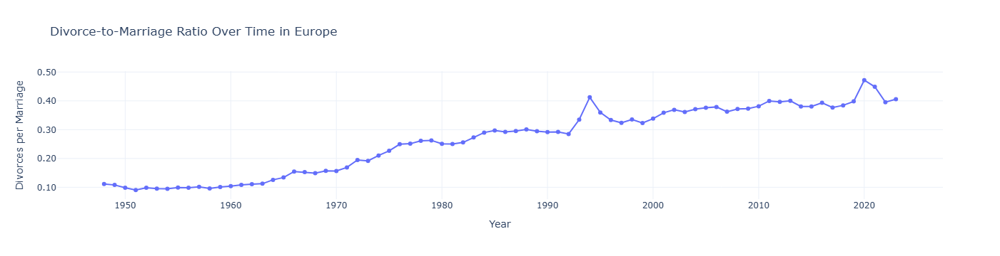

In [31]:
df_total = df[df['Area'] == 'Total'].copy()
europe_yearly = df_total.groupby('Year')[['Divorces', 'Marriages']].sum().reset_index()

# Calculate ratio
europe_yearly['Divorce_to_Marriage_Ratio'] = europe_yearly['Divorces'] / europe_yearly['Marriages']

# Plot using Plotly
fig = px.line(
    europe_yearly,
    x='Year',
    y='Divorce_to_Marriage_Ratio',
    title='Divorce-to-Marriage Ratio Over Time in Europe',
    labels={'Divorce_to_Marriage_Ratio': 'Divorces per Marriage'},
    markers=True
)

fig.update_layout(
    yaxis=dict(tickformat=".2f"),
    hovermode="x unified",
    template="plotly_white"
)

fig.show()

This line graph illustrates a concerning upward trend in marriage-to-divorce ratios over time, suggesting that while marriage and divorce rates may fluctuate, the proportion of marriages ending in divorce is steadily increasing. This could be attributed to various socioeconomic factors, evolving societal norms, or changing expectations within marital relationships, all contributing to a rising likelihood of divorce relative to the number of marriages.

In [33]:
import plotly.graph_objects as go
import plotly.io as pio
pio.write_html(fig, "marriage_d_ratio_ot.html")

#### **3.2.4 Stacked Chart of Marriages and Divorces in Europe**

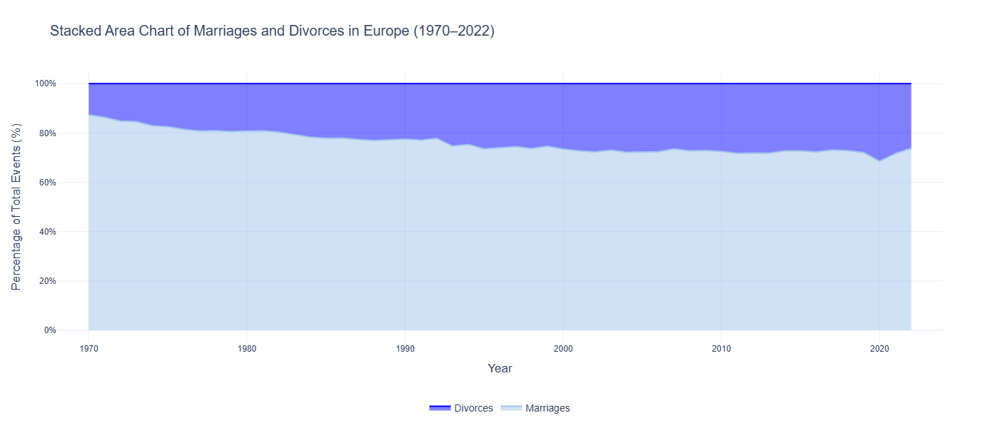

In [35]:
# Filter and clean
df_clean = df.dropna(subset=["Marriages", "Divorces", "Year"])
df_clean = df_clean[df_clean["Year"].between(1970, 2022)]

# Group by year and compute totals
df_grouped = df_clean.groupby("Year")[["Marriages", "Divorces"]].sum().reset_index()

# Normalize to percentages
total = df_grouped["Marriages"] + df_grouped["Divorces"]
df_grouped["Marriages_pct"] = df_grouped["Marriages"] / total * 100
df_grouped["Divorces_pct"] = df_grouped["Divorces"] / total * 100

# Define soft pastel colors
colors = {
    "Marriages": "#A2C4EC",  # pastel blue
    "Divorces": "blue"    # pastel coral
}

# Create the stacked area chart
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df_grouped["Year"],
    y=df_grouped["Marriages_pct"],
    mode="lines",
    name="Marriages",
    stackgroup="one",
    fill="tonexty",
    line=dict(color=colors["Marriages"]),
    hoverinfo="x+y"
))

fig.add_trace(go.Scatter(
    x=df_grouped["Year"],
    y=df_grouped["Divorces_pct"],
    mode="lines",
    name="Divorces",
    stackgroup="one",
    line=dict(color=colors["Divorces"]),
    hoverinfo="x+y"
))

# Layout improvements
fig.update_layout(
    title="Stacked Area Chart of Marriages and Divorces in Europe (1970–2022)",
    xaxis_title="Year",
    yaxis_title="Percentage of Total Events (%)",
    yaxis=dict(range=[-5, 105], ticksuffix="%", tickfont=dict(size=12)),
    xaxis=dict(range=[1968, 2024], tickfont=dict(size=12)),
    template="plotly_white",
    height=600,
    width=950,
    font=dict(family="Arial", size=14),
    hovermode="x unified",
    legend=dict(
        title=None,
        orientation="h",
        x=0.5,
        xanchor="center",
        y=-0.2
    )
)

fig.show()


This is a stacked chart tracking divorce rates across Europe from around 1960 to 2023. In the early 1960s, divorces comprised only about 10–15% of the total events. However, during the 1970s and 1980s, a notable increase in divorce rates emerged. In some periods, the divorce rate even approached 30–40%, likely reflecting changes in social attitudes and the introduction of no-fault divorce laws in several countries. By the 2000s and into the early 2020s, the trend of divorcement increased substantially, with divorce rates appearing to reach roughly one divorce for every two marriages.

In [37]:
pio.write_html(fig, "stacked_chart.html")

#### **3.2.5 Regression of GDP per Capita and Divorce Rate Over Time**

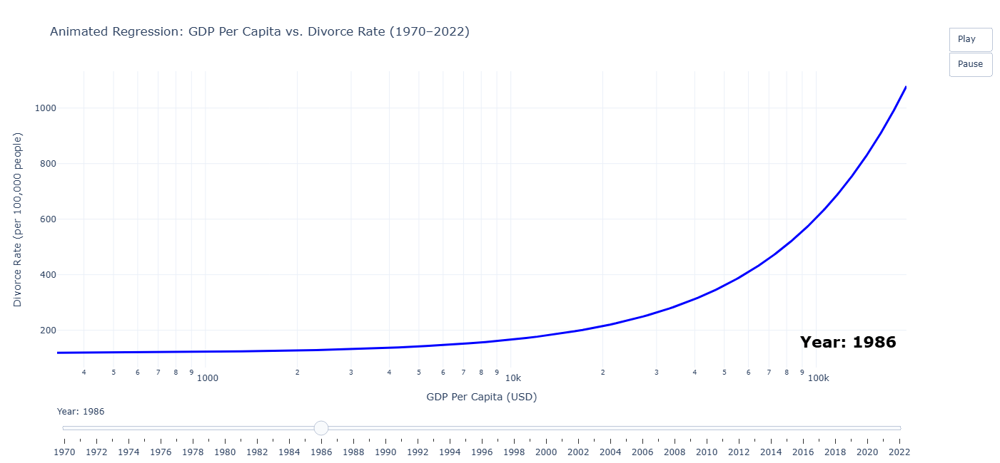

In [587]:
import plotly.graph_objects as go
from statsmodels.api import OLS, add_constant

df_clean = df.dropna(subset=["GDP Per Capita", "Divorce Rate", "Year"])
df_clean = df_clean[df_clean["GDP Per Capita"] > 0]
df_clean["Year"] = df_clean["Year"].astype(int)

# Animation setup
years = sorted(df_clean["Year"].unique())
gdp_range = np.linspace(df_clean["GDP Per Capita"].min(), df_clean["GDP Per Capita"].max(), 200)

# Create animation frames
frames = []
for year in years:
    sub_data = df_clean[df_clean["Year"] <= year]
    X = add_constant(sub_data["GDP Per Capita"])
    y = sub_data["Divorce Rate"]
    model = OLS(y, X).fit()
    y_pred = model.predict(add_constant(gdp_range))

    frames.append(go.Frame(
        data=[

            go.Scatter(
                x=gdp_range,
                y=y_pred,
                mode='lines',
                line=dict(color='blue', width=3),
                name='Regression Line'
            )
        ],
        name=str(year),
        layout=go.Layout(annotations=[
            dict(
                x=0.99, y=0.05, xref="paper", yref="paper",
                text=f"<b>Year: {year}</b>",
                showarrow=False, font=dict(size=22, color="black"),
                align="right"
            )
        ])
    ))

# Initial frame
initial_data = df_clean[df_clean["Year"] <= years[0]]
X0 = add_constant(initial_data["GDP Per Capita"])
model0 = OLS(initial_data["Divorce Rate"], X0).fit()
y_pred0 = model0.predict(add_constant(gdp_range))

# Create figure
fig = go.Figure(
    data=[
        go.Scatter(
            x=gdp_range,
            y=y_pred0,
            mode='lines',
            line=dict(color='blue', width=3),
            name='Regression Line'
        )
    ],
    layout=go.Layout(
        title="Animated Regression: GDP Per Capita vs. Divorce Rate (1970–2022)",
        xaxis=dict(title="GDP Per Capita (USD)", type="log"),
        yaxis=dict(title="Divorce Rate (per 100,000 people)"),
        updatemenus=[dict(
            type="buttons",
            showactive=False,
            buttons=[
                dict(label="Play", method="animate", args=[None, {"frame": {"duration": 300}, "fromcurrent": True}]),
                dict(label="Pause", method="animate", args=[[None], {"frame": {"duration": 0}, "mode": "immediate"}])
            ],
            x=1.1, y=1.15
        )],
        sliders=[{
            "active": 0,
            "currentvalue": {"prefix": "Year: "},
            "pad": {"t": 50},
            "steps": [{
                "args": [[str(year)], {"frame": {"duration": 0}, "mode": "immediate"}],
                "label": str(year),
                "method": "animate"
            } for year in years]
        }],
        height=650,
        width=950,
        template="plotly_white"
    ),
    frames=frames
)

fig.show()


#### **3.2.6 Divorce Rate per 100,000 People in Europe Overtime**

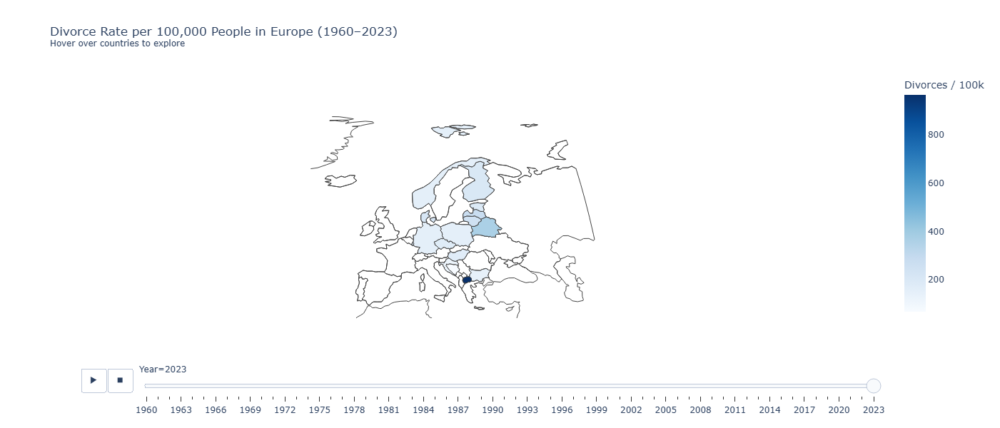

In [589]:
import plotly.express as px

# Filter for Total area and clean missing values
div_map_df = df[df["Area"] == "Total"].dropna(subset=["Divorce Rate"])
div_map_df = div_map_df.sort_values("Year")

# Create animated choropleth with an orange-only gradient
fig = px.choropleth(
    div_map_df,
    locations="Country",
    locationmode="country names",
    color="Divorce Rate",
    hover_name="Country",
    hover_data={
        "Divorces": True,
        "Population": True,
        "Divorce Rate": ':.2f',
        "GDP Per Capita": True
    },
    animation_frame="Year",
    title="Divorce Rate per 100,000 People in Europe (1960–2023)<br><sup>Hover over countries to explore</sup>",
    color_continuous_scale="blues",
    labels={"Divorce Rate": "Divorces per 100,000"},
)

# Zoom into Europe + adjust map styling
fig.update_geos(
    scope="europe",  
    projection_type="natural earth",
    showcoastlines=True,
    showland=True,
    landcolor="white",
    lataxis_range=[35, 72],
    lonaxis_range=[-25, 45],
    fitbounds="locations"
)

# Layout adjustments
fig.update_layout(
    template="plotly_white",  # Clean background for consistency
    width=1000,
    height=600,
    coloraxis_colorbar=dict(title="Divorces / 100k")
)

fig.show()


#### **3.2.7 Divorce-to-Marriage Ratio Across Europe (1960–2023)**


C:\Users\dilan\AppData\Local\Temp\ipykernel_16912\1520179215.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



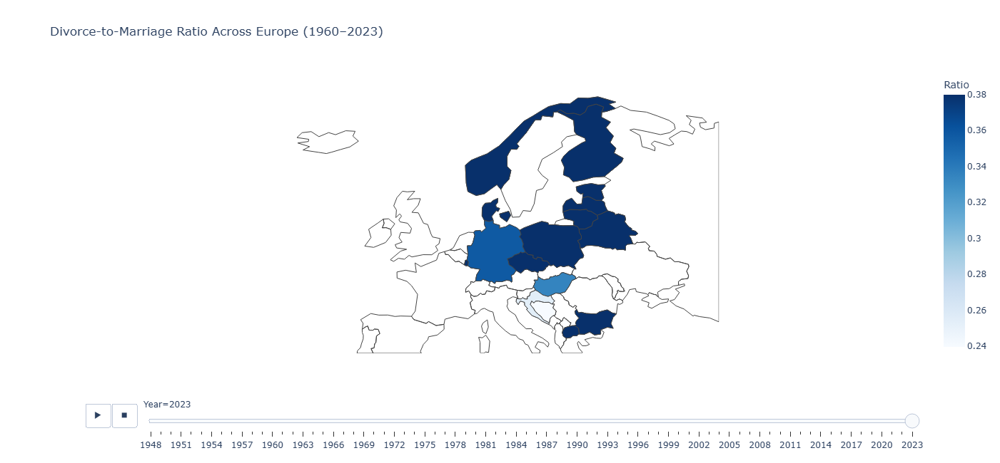

In [15]:
import plotly.express as px
import pandas as pd

# Check if the column "Area" exists and filter the DataFrame
if "Area" in df.columns:
    df1 = df[df["Area"] == "Total"]

# Ensure 'Year' is treated as an integer (if it's not already)
df1['Year'] = pd.to_numeric(df1['Year'], errors='coerce')

# Sort the DataFrame by Year in ascending order
df1 = df1.sort_values('Year')

# Build the choropleth
fig = px.choropleth(
    df1,
    locations="Country",
    locationmode="country names",
    color="Divorce_to_Marriage_Ratio",
    hover_name="Country",
    animation_frame="Year",
    color_continuous_scale="blues",
    range_color=(0.24, 0.38),
    title="Divorce-to-Marriage Ratio Across Europe (1960–2023)"
)

fig.update_geos(
    scope="europe",
    projection_type="natural earth",
    showcoastlines=True,
    showland=True,
    landcolor="white",
    lataxis_range=[35, 72],
    lonaxis_range=[-25, 45],
    fitbounds="locations"
)

# Layout adjustments
fig.update_layout(
    coloraxis=dict(colorbar=dict(title="Ratio")),
    geo=dict(showframe=False, showcoastlines=False),
    template="plotly_white",
    height=650,
    width=950
)

fig.show()


Regional Differences: Countries in Northern and Western Europe, such as Sweden, Denmark, and the UK, show higher divorce rates, visibly marked by deeper color shades on the map more often. Whereas in Southern Europe, countries such as Italy and Spain appear with lighter hues more often, indicating lower divorce rates.
Temporal Dynamics: During specific decades — 1970–1980, it is observable that the changes in several countries display rapidly, showing a sharp uptick following legal reform years.

In [19]:
import plotly.graph_objects as go
import plotly.io as pio
pio.write_html(fig, "marriage_to_divorce_chloropleth.html")

### 3.3 Plotly Interactive Maps <a class="anchor" id="plotly-interactive-maps"></a>

#### **3.3.1 Showing the Divorce rate for countries in Europe in 2017**

C:\Users\dilan\AppData\Local\Temp\ipykernel_5112\444386640.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



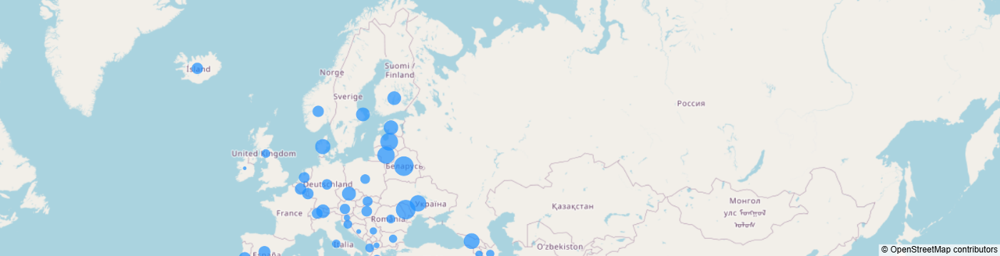

In [517]:
# Filter dataset for Year = 2017 and Area = "Total"
df_filtered = df[(df['Year'] == 2017) & (df['Area'] == "Total")]

# Function to scale marker sizes based on divorce rate
def calc_marker_radius(rate, scale_factor=70):
    return (rate ** 2) * scale_factor  # Squaring to enhance differences
    
df_filtered["Marker Size"] = df_filtered["Divorce Rate"].apply(calc_marker_radius)

# Create Scatter Mapbox
fig = px.scatter_mapbox(df_filtered, 
                        lat="Latitude", lon="Longitude", 
                        hover_name="Country", 
                        hover_data=["Divorce Rate"], 
                        color_discrete_sequence=["#1E90FF"],  # Marker color
                        size="Marker Size")  # Marker size based on divorce rate

# Update the map layout to center on Europe
fig.update_layout(
    mapbox_style="open-street-map",
    mapbox_center={"lat": 50, "lon": 10},  # Center around Europe (approx lat/lon)
    mapbox_zoom=3,  # Adjust zoom level for Europe
    margin={"r":0,"t":0,"l":0,"b":0}  # Remove extra margins
)

# Show the interactive map
fig.show()


In [511]:
# Getting an embedded string
embed_string = plot(fig, output_type='div', include_plotlyjs="cdn")
print(embed_string)

<div>                        <script type="text/javascript">window.PlotlyConfig = {MathJaxConfig: 'local'};</script>
        <script charset="utf-8" src="https://cdn.plot.ly/plotly-2.32.0.min.js"></script>                <div id="888b2fcc-10aa-4fbb-ae0f-d42bb1558041" class="plotly-graph-div" style="height:450px; width:875px;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("888b2fcc-10aa-4fbb-ae0f-d42bb1558041")) {                    Plotly.newPlot(                        "888b2fcc-10aa-4fbb-ae0f-d42bb1558041",                        [{"customdata":[2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003],"hovertemplate":"\u003cb\u003e%{text}\u003c\u002fb\u003e\u003cbr\u003eYear: %{customdata}\u0

#### **3.3.1 Showing the Divorce rate for countries in Europe across multiple years**

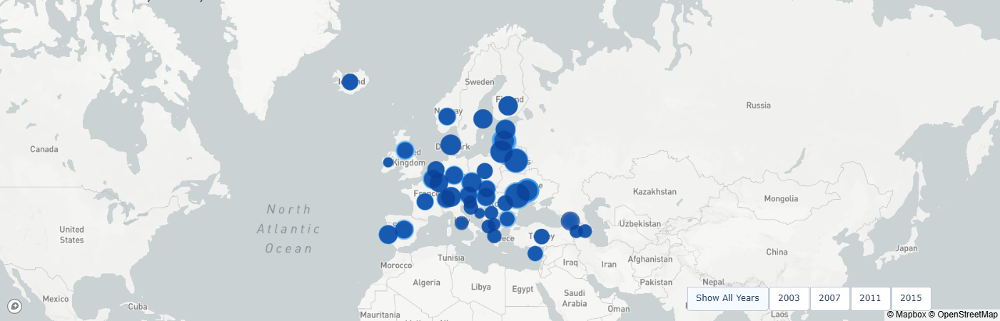

In [35]:
import plotly.graph_objs as go

# Filter the DataFrame to include only rows where Area = 'Total'
dft = df[df['Area'] == 'Total']

# Extract latitude and longitude for plotting
site_lat = dft['Latitude']
site_lon = dft['Longitude']
locations_name = dft['Country']

# Create layout
layout = go.Layout(
    title='Divorce Rates by Country',
    hovermode='closest',
    showlegend=False,
    margin={'l': 0, 't': 0, 'b': 0, 'r': 0},
    mapbox=dict(
        accesstoken="pk.eyJ1Ijoia3lyYW4tZGFsZSIsImEiOiJjanZkbWE0cjkwNjkxNDBwYW0xb3p4MmtqIn0.WP9fQgGMgu8_nmMxJwFsbg",  
        zoom=3,  # Adjust zoom level to fit Europe
        center={"lat": 50, "lon": 10}, 
        style='light'
    ),
    width=875, height=450
)

fig = go.Figure(layout=layout)

# Define the years you want to display
years = [2003, 2007, 2011, 2015]
colors = ["#ADD8E6", "#5DADEC", "#1E90FF", "#0A3D91"]

# Create a list of buttons for each year
buttons = []

# Add "Show All" button to make all markers visible
buttons.append(
    dict(
        label="Show All Years",
        method="update",
        args=[{"visible": [True] * len(years)}, {"title": "Divorce Rates by Country"}]
    )
)

# Create traces for each year
for i, year in enumerate(years):
    df_filtered = dft[dft['Year'] == year]
    fig.add_trace(
    go.Scattermapbox(
        name=str(year),
        lat=df_filtered['Latitude'],
        lon=df_filtered['Longitude'],
        mode='markers',
        marker=dict(
            size=df_filtered['Divorce Rate'] * 15,  # Adjust size by divorce rate
            sizeref=dft['Divorce Rate'].max() / 10 ** 2,
            sizemode='area',
            color=colors[i],
            opacity=0.7
        ),
        text=df_filtered['Country'],
        customdata=df_filtered['Year'],  # Add the year as customdata
        hovertemplate='<b>%{text}</b><br>Year: %{customdata}<br>Divorce Rate = %{marker.size:.2f} per 100,000 people<extra></extra>',
        visible=True if i == 0 else False  # Show the first year by default
    )
)
    # Add button for each year
    buttons.append(
        dict(
            label=str(year),
            method="update",
            args=[{"visible": [j == i for j in range(len(years))]}, {"title": f"Divorce Rates for {year}"}]
        )
    )

# Update layout with buttons
fig.layout.update(
    updatemenus=[
        dict(
            type="buttons",
            direction="right",
            x=0.93,
            y=0.11,
            showactive=True,  # Show the last clicked button
            buttons=buttons,
            active=0  # Set initial active button (default year, e.g., 2003)
        )
    ]
)

# Show the figure
fig.show()


Allows us to visualise which countries have higher divorce rates where countries like Moldova and Belarus have bigger markers across the years suggesting higher levels if divorces

In [37]:
import plotly.graph_objects as go
import plotly.io as pio
pio.write_html(fig, "plotly_map.html")

In [507]:
embed_string = plot(fig, output_type='div', include_plotlyjs="cdn")

In [509]:
print(embed_string)

<div>                        <script type="text/javascript">window.PlotlyConfig = {MathJaxConfig: 'local'};</script>
        <script charset="utf-8" src="https://cdn.plot.ly/plotly-2.32.0.min.js"></script>                <div id="a7757bf1-8adf-4b8a-a801-f7052e939e77" class="plotly-graph-div" style="height:450px; width:875px;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("a7757bf1-8adf-4b8a-a801-f7052e939e77")) {                    Plotly.newPlot(                        "a7757bf1-8adf-4b8a-a801-f7052e939e77",                        [{"customdata":[2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003],"hovertemplate":"\u003cb\u003e%{text}\u003c\u002fb\u003e\u003cbr\u003eYear: %{customdata}\u0

## **4. Plots for deeper Insights: European Countries Divorce Law Reforms** <a class="anchor" id="plots-for-deeper-insights"></a>

#### 4.1 Italy: Impact of Divorce Law Reforms on Marriages and Divorces

Italy (1970 & 2015): Italy's graph shows two critical transition points: initial divorce legalization in 1970 (starting from zero divorces) and the "Fast-Track Divorce Law" in 2015, which reduced mandatory separation from 3 years to just 6 months. After the 2015 reform, divorce numbers jumped by 50%, with the ratio increasing from 25% to over 40%. The dramatic spike to nearly 70% during one period reflects a backlog of separations suddenly becoming divorces, demonstrating how procedural barriers had been artificially suppressing divorce rates.


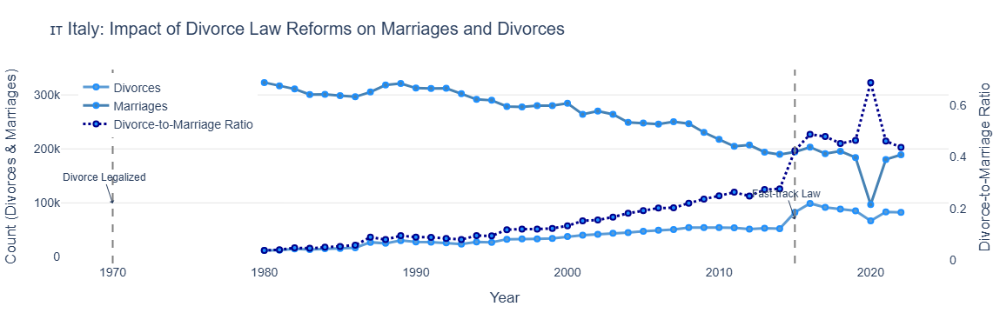

In [46]:
import plotly.graph_objects as go

# Filter data for Italy
italy_df = df[df["Country"] == "Italy"].copy()
italy_df["Divorce_to_Marriage_Ratio"] = italy_df["Divorces"] / italy_df["Marriages"]

# Create figure
fig = go.Figure()

# Plot Divorces with light blue color
fig.add_trace(go.Scatter(
    x=italy_df["Year"], y=italy_df["Divorces"],
    mode="lines+markers", name="Divorces",
    line=dict(color="#5B9BD5", width=3),  # Softer light blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Marriages with medium blue color
fig.add_trace(go.Scatter(
    x=italy_df["Year"], y=italy_df["Marriages"],
    mode="lines+markers", name="Marriages",
    line=dict(color="#4682B4", width=3),  # Softer medium blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Ratio with dark blue color
fig.add_trace(go.Scatter(
    x=italy_df["Year"], y=italy_df["Divorce_to_Marriage_Ratio"],
    mode="lines+markers", name="Divorce-to-Marriage Ratio",
    line=dict(color="#00008B", dash="dot", width=3),  # Dark blue color
    yaxis="y2",
    marker=dict(size=6, color="#1E90FF", line=dict(color="#00008B", width=2))  # Blue markers
))

# Layout: Dual y-axis
fig.update_layout(
    title="🇮🇹 Italy: Impact of Divorce Law Reforms on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(
        title="Count (Divorces & Marriages)",
        side="left",
        showgrid=True,  # Add gridlines
        gridcolor='rgba(169, 169, 169, 0.3)'  # Light gray grid lines
    ),
    yaxis2=dict(
        title="Divorce-to-Marriage Ratio",
        overlaying="y", side="right",
        showgrid=False  # Disable grid for right axis
    ),
    legend=dict(x=0.02, y=0.98),
    height=550,
    font=dict(family="Arial", size=14),  # Increase font size for readability
    plot_bgcolor='white',  # Clean white background
    paper_bgcolor='white',  # Clean paper background
    margin=dict(l=50, r=50, t=80, b=50)  # Adjust margins for better layout
)

# Annotations for reforms
fig.add_vline(x=1970, line_dash="dash", line_color="gray")
fig.add_annotation(x=1970, y=max(italy_df["Divorces"]), text="Divorce Legalized", showarrow=True, arrowhead=1, font=dict(size=12))

fig.add_vline(x=2015, line_dash="dash", line_color="gray")
fig.add_annotation(x=2015, y=max(italy_df["Divorces"])*0.7, text="Fast-track Law", showarrow=True, arrowhead=1, font=dict(size=12))

# Show the plot
fig.show()
pio.write_html(fig, "italy.html")


#### 4.2 Spain: Impact of Express Divorce Law on Marriages and Divorces

Spain (2005): The "Express Divorce Law" eliminated the required separation period and allowed direct divorce just 3 months after filing, creating one of Europe's most dramatic transformations. The graph shows divorce numbers skyrocketing from roughly 50,000 to 130,000 annually almost overnight, with the divorce-to-marriage ratio leaping from 20% to over 60% in just two years. One striking data point shows a ratio spike to 85% in recent years, meaning 85 divorces for every 100 marriages, highlighting how quickly a traditionally Catholic country could transform when legal barriers were removed.

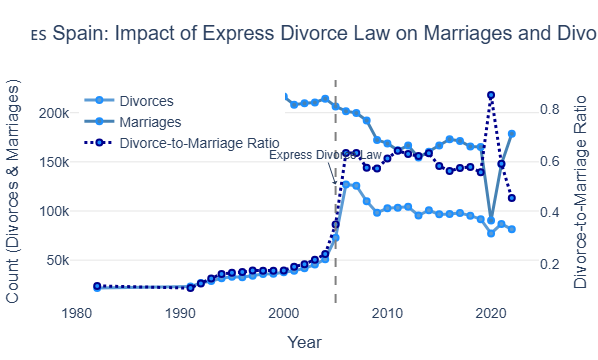

In [49]:
import plotly.graph_objects as go

# Filter data for Spain
spain_df = df[df["Country"] == "Spain"].copy()
spain_df["Divorce_to_Marriage_Ratio"] = spain_df["Divorces"] / spain_df["Marriages"]

# Create figure
fig = go.Figure()

# Plot Divorces with light blue color
fig.add_trace(go.Scatter(
    x=spain_df["Year"], y=spain_df["Divorces"],
    mode="lines+markers", name="Divorces",
    line=dict(color="#5B9BD5", width=3),  # Softer light blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Marriages with medium blue color
fig.add_trace(go.Scatter(
    x=spain_df["Year"], y=spain_df["Marriages"],
    mode="lines+markers", name="Marriages",
    line=dict(color="#4682B4", width=3),  # Softer medium blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Ratio with dark blue color
fig.add_trace(go.Scatter(
    x=spain_df["Year"], y=spain_df["Divorce_to_Marriage_Ratio"],
    mode="lines+markers", name="Divorce-to-Marriage Ratio",
    line=dict(color="#00008B", dash="dot", width=3),  # Dark blue color
    yaxis="y2",
    marker=dict(size=6, color="#1E90FF", line=dict(color="#00008B", width=2))  # Blue markers
))

# Layout: Dual y-axis
fig.update_layout(
    title="🇪🇸 Spain: Impact of Express Divorce Law on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(
        title="Count (Divorces & Marriages)",
        side="left",
        showgrid=True,  # Add gridlines
        gridcolor='rgba(169, 169, 169, 0.3)'  # Light gray grid lines
    ),
    yaxis2=dict(
        title="Divorce-to-Marriage Ratio",
        overlaying="y", side="right",
        showgrid=False  # Disable grid for right axis
    ),
    legend=dict(x=0.02, y=0.98),
    height=550,
    font=dict(family="Arial", size=14),  # Increase font size for readability
    plot_bgcolor='white',  # Clean white background
    paper_bgcolor='white',  # Clean paper background
    margin=dict(l=50, r=50, t=80, b=50)  # Adjust margins for better layout
)

# Annotations for the reform
fig.add_vline(x=2005, line_dash="dash", line_color="gray")
fig.add_annotation(x=2005, y=max(spain_df["Divorces"]), text="Express Divorce Law", showarrow=True, arrowhead=1, font=dict(size=12))

# Show the plot
fig.show()
pio.write_html(fig, "spain.html")


#### 4.3 Sweden: Divorce Reforms and Long-Term Stability

Sweden (1974): Sweden's pioneering reform eliminated all divorce requirements, allowing immediate divorce upon request. The graph shows an immediate 60% increase in divorces following the law, from approximately 15,000 to 25,000 annually. Most notably, unlike other countries that experienced continuous increases, Sweden's ratio quickly stabilized between 40-65% for decades, suggesting it reached its "natural" divorce level much earlier than other European nations. This pattern supports Sweden's reputation as the "future of European relationships," experiencing in the 1970s what other countries would discover decades later.

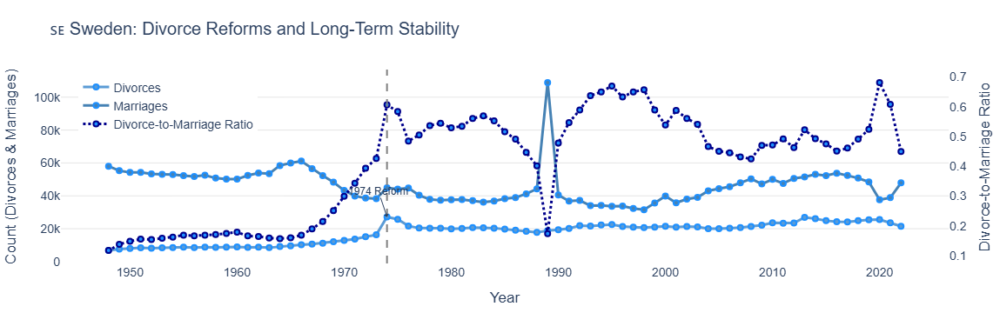

In [51]:
import plotly.graph_objects as go

# Filter data for Sweden
sweden_df = df[df["Country"] == "Sweden"].copy()
sweden_df["Divorce_to_Marriage_Ratio"] = sweden_df["Divorces"] / sweden_df["Marriages"]

# Create figure
fig = go.Figure()

# Plot Divorces with light blue color
fig.add_trace(go.Scatter(
    x=sweden_df["Year"], y=sweden_df["Divorces"],
    mode="lines+markers", name="Divorces",
    line=dict(color="#5B9BD5", width=3),  # Softer light blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Marriages with medium blue color
fig.add_trace(go.Scatter(
    x=sweden_df["Year"], y=sweden_df["Marriages"],
    mode="lines+markers", name="Marriages",
    line=dict(color="#4682B4", width=3),  # Softer medium blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Ratio with dark blue color
fig.add_trace(go.Scatter(
    x=sweden_df["Year"], y=sweden_df["Divorce_to_Marriage_Ratio"],
    mode="lines+markers", name="Divorce-to-Marriage Ratio",
    line=dict(color="#00008B", dash="dot", width=3),  # Dark blue color
    yaxis="y2",
    marker=dict(size=6, color="#1E90FF", line=dict(color="#00008B", width=2))  # Blue markers
))

# Layout: Dual y-axis
fig.update_layout(
    title="🇸🇪 Sweden: Divorce Reforms and Long-Term Stability",
    xaxis_title="Year",
    yaxis=dict(
        title="Count (Divorces & Marriages)",
        side="left",
        showgrid=True,  # Add gridlines
        gridcolor='rgba(169, 169, 169, 0.3)'  # Light gray grid lines
    ),
    yaxis2=dict(
        title="Divorce-to-Marriage Ratio",
        overlaying="y", side="right",
        showgrid=False  # Disable grid for right axis
    ),
    legend=dict(x=0.02, y=0.98),
    height=550,
    font=dict(family="Arial", size=14),  # Increase font size for readability
    plot_bgcolor='white',  # Clean white background
    paper_bgcolor='white',  # Clean paper background
    margin=dict(l=50, r=50, t=80, b=50)  # Adjust margins for better layout
)

# Annotations for the reform
fig.add_vline(x=1974, line_dash="dash", line_color="gray")
fig.add_annotation(x=1974, y=max(sweden_df["Divorces"]), text="1974 Reform", showarrow=True, arrowhead=1, font=dict(size=12))

# Show the plot
fig.show()
pio.write_html(fig, "sweden.html")


#### 4.4 France: Impact of 1975 No-Fault Divorce Law on Marriages and Divorces

France (1975): The No-Fault Divorce Law created four types of divorce including mutual consent and unilateral divorce after 6 years of separation. Unlike the UK's immediate spike, France experienced a more gradual but persistent increase in divorces from approximately 50,000 to over 100,000 within a decade. The divorce-to-marriage ratio shows a consistent upward trajectory from 10% to over 50%, with recent data showing peaks above 55%, suggesting continued evolution of social attitudes long after the legal changes.

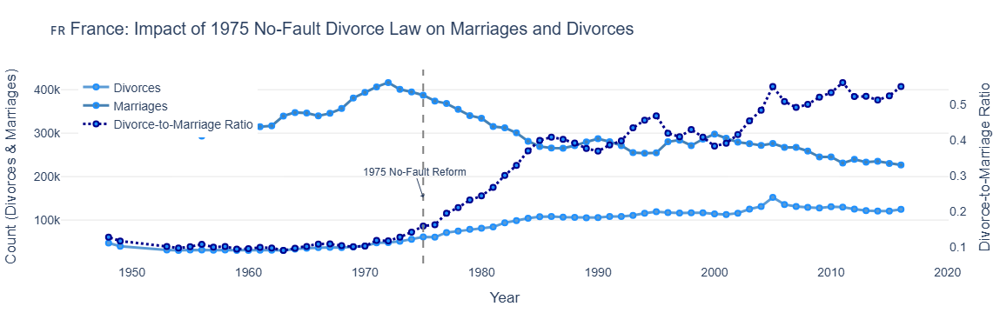

In [53]:
import plotly.graph_objects as go

# Filter data for France
france_df = df[df["Country"] == "France"].copy()
france_df["Divorce_to_Marriage_Ratio"] = france_df["Divorces"] / france_df["Marriages"]

# Create figure
fig = go.Figure()

# Plot Divorces with light blue color
fig.add_trace(go.Scatter(
    x=france_df["Year"], y=france_df["Divorces"],
    mode="lines+markers", name="Divorces",
    line=dict(color="#5B9BD5", width=3),  # Softer light blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Marriages with medium blue color
fig.add_trace(go.Scatter(
    x=france_df["Year"], y=france_df["Marriages"],
    mode="lines+markers", name="Marriages",
    line=dict(color="#4682B4", width=3),  # Softer medium blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Ratio with dark blue color
fig.add_trace(go.Scatter(
    x=france_df["Year"], y=france_df["Divorce_to_Marriage_Ratio"],
    mode="lines+markers", name="Divorce-to-Marriage Ratio",
    line=dict(color="#00008B", dash="dot", width=3),  # Dark blue color
    yaxis="y2",
    marker=dict(size=6, color="#1E90FF", line=dict(color="#00008B", width=2))  # Blue markers
))

# Layout: Dual y-axis
fig.update_layout(
    title="🇫🇷 France: Impact of 1975 No-Fault Divorce Law on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(
        title="Count (Divorces & Marriages)",
        side="left",
        showgrid=True,  # Add gridlines
        gridcolor='rgba(169, 169, 169, 0.3)'  # Light gray grid lines
    ),
    yaxis2=dict(
        title="Divorce-to-Marriage Ratio",
        overlaying="y", side="right",
        showgrid=False  # Disable grid for right axis
    ),
    legend=dict(x=0.02, y=0.98),
    height=550,
    font=dict(family="Arial", size=14),  # Increase font size for readability
    plot_bgcolor='white',  # Clean white background
    paper_bgcolor='white',  # Clean paper background
    margin=dict(l=50, r=50, t=80, b=50)  # Adjust margins for better layout
)

# Annotations for the reform
fig.add_vline(x=1975, line_dash="dash", line_color="gray")
fig.add_annotation(x=1975, y=max(france_df["Divorces"]), text="1975 No-Fault Reform", showarrow=True, arrowhead=1, font=dict(size=12))

# Show the plot
fig.show()
pio.write_html(fig, "france.html")

#### 4.5 Portugal: Impact of 2008 Mutual Consent Divorce Reform on Marriages and Divorces

Portugal (2008): The Mutual Consent Reform eliminated fault requirements and allowed administrative divorces without court involvement. While the graph shows divorce numbers remained relatively stable around 25,000 annually, the simultaneously declining marriage rate (from about 70,000 to 30,000) caused the ratio to climb significantly. The remarkable spike to nearly 90% ratio during what appears to be an economic downturn suggests financial pressures may amplify divorce decisions when legal barriers are minimal.

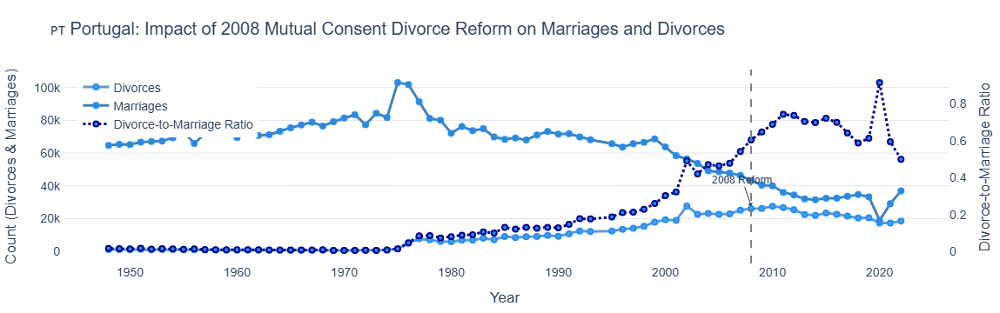

In [55]:
import plotly.graph_objects as go

# Filter data for Portugal
portugal_df = df[df["Country"] == "Portugal"].copy()
portugal_df["Divorce_to_Marriage_Ratio"] = portugal_df["Divorces"] / portugal_df["Marriages"]

# Create figure
fig = go.Figure()

# Plot Divorces with light blue color
fig.add_trace(go.Scatter(
    x=portugal_df["Year"], y=portugal_df["Divorces"],
    mode="lines+markers", name="Divorces",
    line=dict(color="#5B9BD5", width=3),  # Softer light blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Marriages with medium blue color
fig.add_trace(go.Scatter(
    x=portugal_df["Year"], y=portugal_df["Marriages"],
    mode="lines+markers", name="Marriages",
    line=dict(color="#4682B4", width=3),  # Softer medium blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Ratio with dark blue color
fig.add_trace(go.Scatter(
    x=portugal_df["Year"], y=portugal_df["Divorce_to_Marriage_Ratio"],
    mode="lines+markers", name="Divorce-to-Marriage Ratio",
    line=dict(color="#00008B", dash="dot", width=3),  # Dark blue color
    yaxis="y2",
    marker=dict(size=6, color="#1E90FF", line=dict(color="#00008B", width=2))  # Blue markers
))

# Layout: Dual y-axis
fig.update_layout(
    title="🇵🇹 Portugal: Impact of 2008 Mutual Consent Divorce Reform on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(
        title="Count (Divorces & Marriages)",
        side="left",
        showgrid=True,  # Add gridlines
        gridcolor='rgba(169, 169, 169, 0.3)'  # Light gray grid lines
    ),
    yaxis2=dict(
        title="Divorce-to-Marriage Ratio",
        overlaying="y", side="right",
        showgrid=False  # Disable grid for right axis
    ),
    legend=dict(x=0.02, y=0.98),
    height=550,
    font=dict(family="Arial", size=14),  # Increase font size for readability
    plot_bgcolor='white',  # Clean white background
    paper_bgcolor='white',  # Clean paper background
    margin=dict(l=50, r=50, t=80, b=50)  # Adjust margins for better layout
)

# Add annotation for the reform year
fig.add_vline(x=2008, line_dash="dash", line_color="gray")
fig.add_annotation(x=2008, y=max(portugal_df["Divorces"]), text="2008 Reform", showarrow=True, arrowhead=1, font=dict(size=12))

# Show the plot
fig.show()
pio.write_html(fig, "portugal.html")

#### 4.6 Greece: Impact of 1983 Family Law Reform on Marriages and Divorces

Greece (1983): The Family Law Reform introduced no-fault divorce and eliminated discrimination against women in family law. The graph clearly shows that before reform, Greece's divorce-to-marriage ratio was under 5% (one of Europe's lowest), eventually rising to 20-35%. Unlike Western European countries, Greece's ratio remained relatively modest, and the highly volatile pattern with sharp spikes to 35% appears to coincide with periods of economic crisis, particularly visible during the 2008-2010 financial crisis and subsequent austerity measures.

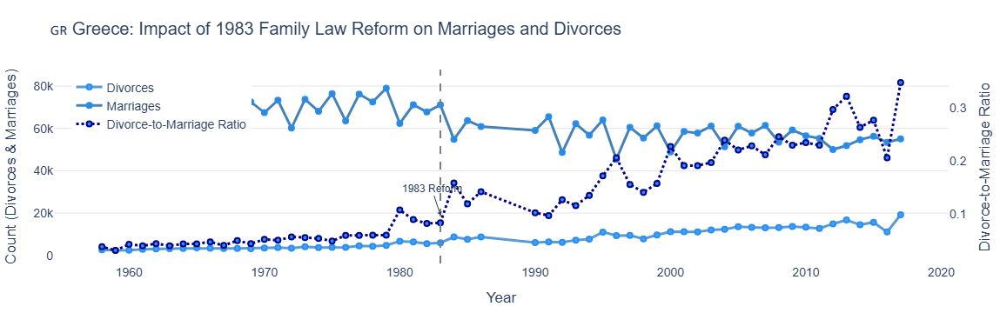

In [57]:
import plotly.graph_objects as go

# Filter data for Greece
greece_df = df[df["Country"] == "Greece"].copy()
greece_df["Divorce_to_Marriage_Ratio"] = greece_df["Divorces"] / greece_df["Marriages"]

# Create figure
fig = go.Figure()

# Plot Divorces with light blue color
fig.add_trace(go.Scatter(
    x=greece_df["Year"], y=greece_df["Divorces"],
    mode="lines+markers", name="Divorces",
    line=dict(color="#5B9BD5", width=3),  # Light blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Marriages with medium blue color
fig.add_trace(go.Scatter(
    x=greece_df["Year"], y=greece_df["Marriages"],
    mode="lines+markers", name="Marriages",
    line=dict(color="#4682B4", width=3),  # Medium blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Ratio with dark blue color
fig.add_trace(go.Scatter(
    x=greece_df["Year"], y=greece_df["Divorce_to_Marriage_Ratio"],
    mode="lines+markers", name="Divorce-to-Marriage Ratio",
    line=dict(color="#00008B", dash="dot", width=3),  # Dark blue color
    yaxis="y2",
    marker=dict(size=6, color="#1E90FF", line=dict(color="#00008B", width=2))  # Blue markers
))

# Layout: Dual y-axis
fig.update_layout(
    title="🇬🇷 Greece: Impact of 1983 Family Law Reform on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(
        title="Count (Divorces & Marriages)",
        side="left",
        showgrid=True,  # Add gridlines
        gridcolor='rgba(169, 169, 169, 0.3)'  # Light gray grid lines
    ),
    yaxis2=dict(
        title="Divorce-to-Marriage Ratio",
        overlaying="y", side="right",
        showgrid=False  # Disable grid for right axis
    ),
    legend=dict(x=0.02, y=0.98),
    height=550,
    font=dict(family="Arial", size=14),  # Increase font size for readability
    plot_bgcolor='white',  # Clean white background
    paper_bgcolor='white',  # Clean paper background
    margin=dict(l=50, r=50, t=80, b=50)  # Adjust margins for better layout
)

# Add annotation for the reform year
fig.add_vline(x=1983, line_dash="dash", line_color="gray")
fig.add_annotation(x=1983, y=max(greece_df["Divorces"]), text="1983 Reform", showarrow=True, arrowhead=1, font=dict(size=12))

# Show the plot
fig.show()
pio.write_html(fig, "greece.html")

#### 4.7 United Kingdom: Impact of 1971 Divorce Reform Act on Marriages and Divorces

United Kingdom (1971): The Divorce Reform Act eliminated the need to prove matrimonial offense and introduced "irretrievable breakdown" as the sole ground for divorce. Divorce rates doubled from approximately 50,000 to over 100,000 annually within two years, while the divorce-to-marriage ratio increased from 10% to 60% over time. Notably, marriage numbers steadily declined from 470,000 to below 250,000 annually. The graph shows a clear inflection point at 1971 with a sustained impact that permanently altered the UK's marriage landscape.

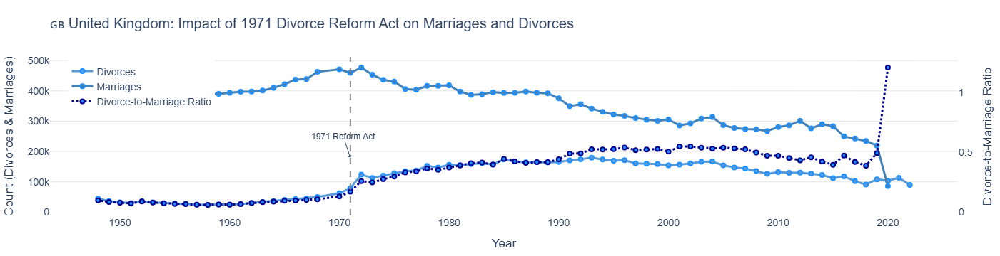

In [59]:
import plotly.graph_objects as go

# Filter data for the United Kingdom
uk_df = df[(df["Country"] == "United Kingdom")].copy()

# Create figure
fig = go.Figure()

# Plot Divorces with light blue color
fig.add_trace(go.Scatter(
    x=uk_df["Year"], y=uk_df["Divorces"],
    mode="lines+markers", name="Divorces",
    line=dict(color="#5B9BD5", width=3),  # Light blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Marriages with medium blue color
fig.add_trace(go.Scatter(
    x=uk_df["Year"], y=uk_df["Marriages"],
    mode="lines+markers", name="Marriages",
    line=dict(color="#4682B4", width=3),  # Medium blue color
    marker=dict(size=6, line=dict(color="#1E90FF", width=2))  # Blue markers with white outline
))

# Plot Ratio with dark blue color
fig.add_trace(go.Scatter(
    x=uk_df["Year"], y=uk_df["Divorce_to_Marriage_Ratio"],
    mode="lines+markers", name="Divorce-to-Marriage Ratio",
    line=dict(color="#00008B", dash="dot", width=3),  # Dark blue color
    yaxis="y2",
    marker=dict(size=6, color="#1E90FF", line=dict(color="#00008B", width=2))  # Blue markers
))

# Layout: Dual y-axis
fig.update_layout(
    title="🇬🇧 United Kingdom: Impact of 1971 Divorce Reform Act on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(
        title="Count (Divorces & Marriages)",
        side="left",
        showgrid=True,  # Add gridlines
        gridcolor='rgba(169, 169, 169, 0.3)'  # Light gray grid lines
    ),
    yaxis2=dict(
        title="Divorce-to-Marriage Ratio",
        overlaying="y", side="right",
        showgrid=False  # Disable grid for right axis
    ),
    legend=dict(x=0.02, y=0.98),
    height=550,
    font=dict(family="Arial", size=14),  # Increase font size for readability
    plot_bgcolor='white',  # Clean white background
    paper_bgcolor='white',  # Clean paper background
    margin=dict(l=50, r=50, t=80, b=50)  # Adjust margins for better layout
)

# Add annotation for the 1971 reform year
fig.add_vline(x=1971, line_dash="dash", line_color="gray")
fig.add_annotation(x=1971, y=max(uk_df["Divorces"]), text="1971 Reform Act", showarrow=True, arrowhead=1, font=dict(size=12))

# Show the plot
fig.show()
pio.write_html(fig, "uk.html")

#### 4.8 Projecting Divorce-to-Marriage Ratio in Europe (1960-2050)

C:\Users\dilan\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\dilan\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\dilan\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\dilan\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\dilan\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\dilan\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model

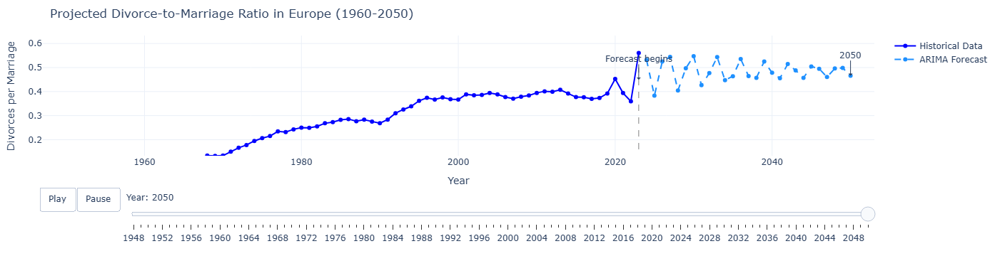

In [61]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from statsmodels.tsa.arima.model import ARIMA

# Group by year
yearly = df.groupby("Year")["Divorce_to_Marriage_Ratio"].mean().reset_index()
yearly["Year"] = yearly["Year"].astype(int)

# Fit ARIMA model
model = ARIMA(yearly[["Year", "Divorce_to_Marriage_Ratio"]].set_index("Year"), order=(2, 1, 2))
fitted = model.fit()

# Generate forecast to 2050
last_year = yearly["Year"].max()
forecast_steps = 2050 - last_year  # Calculate steps needed to reach 2050
forecast_years = np.arange(last_year + 1, 2051)  # Go up to 2050
forecast = fitted.get_forecast(steps=forecast_steps)
forecast_mean = forecast.predicted_mean.values
conf_int = forecast.conf_int()

# Create animation data
# Add a column to track the animation frame for each year
yearly["frame"] = yearly.index
yearly["type"] = "Historical"

# Create forecast dataframe with same structure
forecast_df = pd.DataFrame({
    "Year": forecast_years,
    "Divorce_to_Marriage_Ratio": forecast_mean,
    "frame": range(len(yearly), len(yearly) + len(forecast_years)),
    "type": "Forecast"
})

# Combine both dataframes
all_data = pd.concat([yearly, forecast_df])

# Create figure
fig = go.Figure()

# Add empty traces that will be filled during animation
fig.add_trace(
    go.Scatter(
        x=[yearly["Year"].min()],
        y=[yearly["Divorce_to_Marriage_Ratio"].iloc[0]],
        mode="lines+markers",
        name="Historical Data",
        line=dict(color="blue", width=2)
    )
)

fig.add_trace(
    go.Scatter(
        x=[],
        y=[],
        mode="lines+markers",
        name="ARIMA Forecast",
        line=dict(color="orange", width=2, dash="dash")
    )
)

# Create frames - one for each year
frames = []
for i in range(len(all_data)):
    # Get data up to this frame
    current_frame = all_data[all_data["frame"] <= i]
    historical = current_frame[current_frame["type"] == "Historical"]
    forecast = current_frame[current_frame["type"] == "Forecast"]
    
    frame = go.Frame(
        data=[
            # Update historical line
            go.Scatter(
                x=historical["Year"],
                y=historical["Divorce_to_Marriage_Ratio"],
                mode="lines+markers",
                line=dict(color="blue", width=2)
            ),
            # Update forecast line
            go.Scatter(
                x=forecast["Year"],
                y=forecast["Divorce_to_Marriage_Ratio"],
                mode="lines+markers",
                line=dict(color="#1E90FF", width=2, dash="dash")
            )
        ],
        name=str(i)
    )
    frames.append(frame)

# Add frames to figure
fig.frames = frames

# Layout
fig.update_layout(
    # Updated title with correct year range
    title="Projected Divorce-to-Marriage Ratio in Europe (1960-2050)",
    
    # Fixed axis ranges
    xaxis=dict(range=[yearly["Year"].min() - 2, 2052], title="Year"),
    yaxis=dict(
        range=[0, 0.5],  # Set a fixed range with good headroom
        dtick=0.1,       # Set tick interval to 0.1
        title="Divorces per Marriage"
    ),
    
    # Improved button positioning
    updatemenus=[{
        "type": "buttons",
        "buttons": [
            {
                "label": "Play",
                "method": "animate",
                "args": [None, {"frame": {"duration": 200}, "fromcurrent": True, "transition": {"duration": 0}}]
            },
            {
                "label": "Pause",
                "method": "animate",
                "args": [[None], {"frame": {"duration": 0}, "mode": "immediate"}]
            }
        ],
        "direction": "left",
        "pad": {"r": 10, "t": 10},
        "showactive": False,
        "x": 0.1,
        "y": -0.2,  # Move buttons down to avoid overlap
        "xanchor": "right",
        "yanchor": "top"
    }],
    
    # Increase bottom margin to make room for controls
    margin=dict(b=100, l=60, r=20, t=50),
    template="plotly_white",
    
    # Add a vertical line marking transition from historical to forecast
    shapes=[
        dict(
            type="line",
            x0=last_year,
            y0=0,
            x1=last_year,
            y1=0.5,
            line=dict(color="gray", width=1, dash="dash")
        )
    ],
    
    # Add annotation to mark forecast beginning
    annotations=[
        dict(
            x=last_year,
            y=0.45,
            xref="x",
            yref="y",
            text="Forecast begins",
            showarrow=True,
            arrowhead=1,
            ax=0,
            ay=-30
        ),
        dict(
            x=2050,
            y=forecast_mean[-1],
            text="2050",
            showarrow=True,
            arrowhead=1,
            ax=0,
            ay=-30
        )   
    ]
)
# Improved slider positioning
sliders = [{
    "active": 0,
    "steps": [{"args": [[str(i)], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
               "label": str(year), "method": "animate"} 
              for i, year in enumerate(all_data["Year"])],
    "x": 0.1,
    "y": -0.1,  # Move slider up from buttons
    "currentvalue": {"visible": True, "prefix": "Year: "},
    "len": 0.9,
    "pad": {"b": 10, "t": 30}
}]
fig.update_layout(sliders=sliders)
fig.show()
pio.write_html(fig, "projection.html")

The projected divorce-to-marriage ratio graph for Europe shows a clear historical progression and future forecast from 1960 to 2050. The historical data (dark blue line) reveals three distinct phases: stability at around 0.1 (10 divorces per 100 marriages) from 1948 to 1968, followed by a steep increase from 1970 through 1995 as divorce reforms spread across Europe, then levelling off around 0.38-0.40 between 1996 and 2019 with minor fluctuations. A notable spike occurs in 2020, reaching 0.4524559 according to the data point highlighted on the graph, likely reflecting pandemic disruptions. The ARIMA forecast (light blue dashed line) beginning in 2020 predicts continued volatility through the 2020s and 2030s but overall stabilization around 0.5 by 2050, suggesting Europe may have reached a natural equilibrium where roughly half of all marriages will end in divorce. This projection points to a future where divorce rates stabilize rather than continue to climb, despite ongoing declines in marriage rates throughout the continent.

## **5. Data Wrapper Charts** <a class="anchor" id="data-wrapper-charts"></a>

In [44]:
from IPython.display import IFrame
chart_url = "https://datawrapper.dwcdn.net/rVHFM/2/"  
IFrame(chart_url, width=800, height=600)


In [9]:
from IPython.display import IFrame
chart_url = "https://datawrapper.dwcdn.net/8oHIh/3/ "  
IFrame(chart_url, width=800, height=600)

This graph is quite interesting since it takes the map one step further by classifying whether divorces are balanced across a country or whether it is leaning towards rural or urban areas having more divorces and the extent of this as well

In [63]:
chart_url = "https://datawrapper.dwcdn.net/tbuTm/1/"  
IFrame(chart_url, width=800, height=600)


In [65]:
chart_url = "https://datawrapper.dwcdn.net/yjH2r/2/"  
IFrame(chart_url, width=800, height=600)

## **6. Conclusion** <a class="anchor" id="conclusion"></a>

In conclusion, the trends in divorce rates across Europe reveal significant regional, socio-cultural, and temporal variations, with higher divorce rates observed in Northern and Western Europe, reflecting liberal legal reforms and evolving social norms. Meanwhile, Southern and Eastern Europe maintain lower rates due to more traditional family values and religious influences as demonstrated across multiple visualisations we have created. Key factors influencing divorce include urbanisation, economic prosperity, and changing societal attitudes. If we had more time to expand this project further we could conduct deeper analysis into specific age groups, education levels, or marriage duration to enhance our understanding of the evolving dynamics in marital stability across Europe. Perhaps also pin-pointing which factors have a more significant impact on divorce levels.